In [2]:
import numpy as np
import sys
import time
import h5py
from tqdm import tqdm

import numpy as np
import re
from math import ceil
from sklearn.metrics import average_precision_score
from torch.utils.data import Dataset
import torch
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
import pickle
#import pickle5 as pickle

from sklearn.model_selection import train_test_split

from scipy.sparse import load_npz
from glob import glob

from transformers import get_constant_schedule_with_warmup
from sklearn.metrics import precision_score,recall_score,accuracy_score

from src.train import trainModel
from src.dataloader import getData,spliceDataset,h5pyDataset,getDataPointList,getDataPointListFull,DataPoint
from src.weight_init import keras_init
from src.losses import categorical_crossentropy_2d
from src.model import SpliceFormer
from src.evaluation_metrics import print_topl_statistics
import copy
from collections import OrderedDict
#import tensorflow as tf

In [3]:
#!pip install pickle5

In [4]:
!nvidia-smi

Thu Jul 24 11:24:06 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3080        Off |   00000000:01:00.0 Off |                  N/A |
| 32%   32C    P0             61W /  320W |       0MiB /  10240MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
rng = np.random.default_rng(23673)

In [6]:
data_dir = '../Data'

In [7]:
setType = 'train'
annotation, transcriptToLabel, seqData = getData(data_dir, setType)

In [8]:
#gtf = None

In [9]:
L = 32
N_GPUS = 8
k = 2
# Hyper-parameters:
# L: Number of convolution kernels
# W: Convolution window size in each residual unit
# AR: Atrous rate in each residual unit

W = np.asarray([11, 11, 11, 11, 11, 11, 11, 11,
                21, 21, 21, 21, 41, 41, 41, 41])
AR = np.asarray([1, 1, 1, 1, 4, 4, 4, 4,
                 10, 10, 10, 10, 25, 25, 25, 25])
BATCH_SIZE = k*6*N_GPUS


CL = 2 * np.sum(AR*(W-1))

In [10]:
SL=5000
CL_max=40000

In [20]:
setType = 'test'
annotation_test, transcriptToLabel_test, seqData = getData(data_dir, setType)    

In [16]:
activation = {}

def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook
NUM_ACCUMULATION_STEPS = 1
temp = 1
n_models = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_m = SpliceFormer(CL_max,bn_momentum=0.01/NUM_ACCUMULATION_STEPS,depth=4,heads=4,n_transformer_blocks=2,determenistic=True)
model_m.apply(keras_init)
model_m = model_m.to(device)

if torch.cuda.device_count() > 1:
    model_m = nn.DataParallel(model_m)

output_class_labels = ['Null', 'Acceptor', 'Donor']

#for output_class in [1,2]:
models = [copy.deepcopy(model_m) for i in range(n_models)]

if torch.cuda.device_count() > 1:
    [model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_171022_{}'.format(i))) for i,model in enumerate(models)]
else:
    for i,model in enumerate(models):
        state_dict = torch.load('../Results/PyTorch_Models/transformer_encoder_40k_171022_{}'.format(i))
        new_state_dict = OrderedDict()
        for k, v in state_dict.items():
            name = k[7:] # remove `module.`
            new_state_dict[name] = v
        model.load_state_dict(new_state_dict)

#nr = [0,2,3]
#[model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_161022_{}'.format(i))) for i,model in enumerate(models[5:])]

#[model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_171022_{}'.format(i))) for i,model in enumerate(models)]


#nr = [0,2,3]
#[model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_201221_{}'.format(nr[i]))) for i,model in enumerate(models)]
#chunkSize = num_idx/10
for model in models:
    model.eval()


In [17]:
BATCH_SIZE=1

In [21]:
specific_anno = annotation_test[annotation_test['name'].apply(lambda x: x.split('--')[0])=='CFTR']

In [22]:
def odds_gmean(prediction,n_models,a = 1.5):
    p = torch.pow(torch.prod(prediction,dim=0), a/n_models)
    p_neg = torch.pow(torch.prod(1-prediction,dim=0), a/n_models)
    return p / (p+p_neg)

test_dataset = spliceDataset(getDataPointList(specific_anno,transcriptToLabel_test,SL,CL_max,shift=SL))
test_dataset.seqData = seqData
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0, pin_memory=True)
outputs = []
stds = []
targets = []
predictions = []
for (batch_features ,target) in tqdm(test_loader):
    batch_features = batch_features.type(torch.FloatTensor).to(device)
    target = target.to(device)
    targets.append(target)
    prediction = ([models[i](batch_features)[0].detach() for i in range(n_models)])
    std = torch.std(torch.stack(prediction),dim=0)
    stds.append(std)
    prediction = torch.stack(prediction)
    predictions.append(prediction[:,0,:,:])
    prediction = torch.mean(prediction,dim=0)
    #prediction = odds_gmean(prediction,n_models)
    outputs.append(prediction)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [04:49<00:00,  7.61s/it]


In [24]:
len(models)

10

In [25]:
predictions = torch.cat(predictions,dim=2)
predictions = predictions.cpu().detach().numpy()
outputs = torch.cat(outputs,dim=2)
stds = torch.cat(stds,dim=2)
targets = torch.cat(targets,dim=2)
outputs = outputs.cpu().detach().numpy()
stds = stds.cpu().detach().numpy()
targets = targets.cpu().detach().numpy()

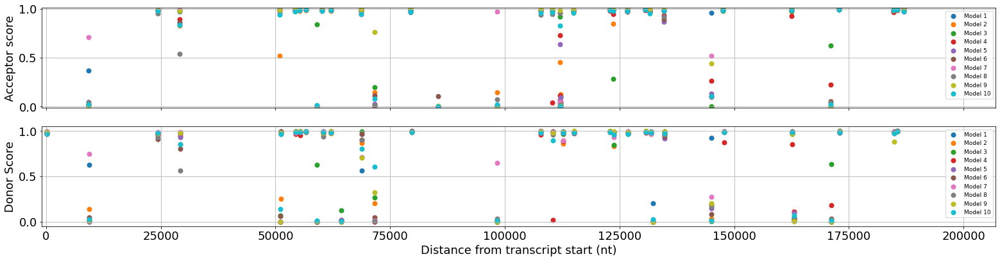

In [29]:
plt.rcParams.update({'font.size': 18})
fig, (ax1, ax2) = plt.subplots(2, 1,figsize=(22, 6),sharex=True)
x = np.arange(outputs.shape[2])
cond1 = np.any(predictions[:,1,:]>=0.1,axis=0)
cond2 = np.any(predictions[:,2,:]>=0.1,axis=0)
for i in range(n_models):
    y = predictions[i,:,:]
    
    ax1.scatter(x[cond1],y[1,cond1],linewidth=2,label='Model {}'.format(i+1))
    
    ax2.scatter(x[cond2],y[2,cond2],linewidth=2,label='Model {}'.format(i+1))

#ax2.scatter(np.arange(outputs.shape[2])[cond],outputs[0,2,:][cond]+0.1,c='green',marker="^", clip_on=False, zorder=10,label='Annotated\ndonor')
plt.xlabel('Distance from transcript start (nt)')
ax1.set_ylabel('Acceptor score')
ax1.set_xlim([-1000,207000])
ax1.set_ylim([-0.01,1.01])
ax2.set_ylabel('Donor Score')
ax1.grid()
ax2.grid()
ax1.legend(prop={'size': 9})
ax2.legend(prop={'size': 9})
plt.tight_layout()
plt.savefig('../Results/Transformer_CFTR_model_all_attention_scores_240725.png', dpi=400)
plt.show()

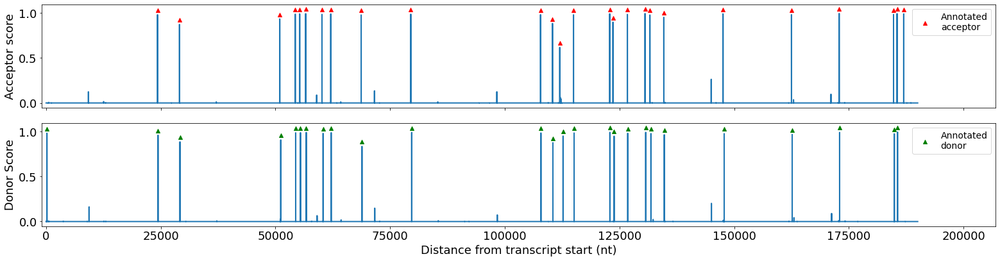

In [30]:
plt.rcParams.update({'font.size': 18})
fig, (ax1, ax2) = plt.subplots(2, 1,figsize=(22, 6),sharex=True)
x = np.arange(outputs.shape[2])



ax1.plot(x,outputs[0,1,:],linewidth=2,zorder=-32)
cond = outputs[0,1,:]>=0.025
#yerr_lo = np.min(np.vstack([conf[0,1,cond],outputs[0,1,cond]-.00001]),0)
#yerr_lo = conf[0,1,cond]
#yerr_hi = conf[0,1,cond]
#yerr_hi = np.min(np.vstack([conf[0,1,cond],1-outputs[0,1,cond]]),0)
#ax1.errorbar(x[cond],outputs[0,1,cond],[yerr_lo,yerr_hi],fmt="none",color='k', capsize=7.5, elinewidth=3,label='95% CI')

ax2.plot(x,outputs[0,2,:],linewidth=2,zorder=-32)

cond = outputs[0,2,:]>=0.025

#yerr_lo = np.min(np.vstack([conf[0,2,cond],outputs[0,2,cond]-.00001]),0)
#yerr_lo = conf[0,1,cond]
#yerr_hi = conf[0,1,cond]
#yerr_hi = np.min(np.vstack([conf[0,2,cond],1-outputs[0,2,cond]]),0)
#ax2.errorbar(x[cond],outputs[0,2,cond],[yerr_lo,yerr_hi],fmt="none",color='k', capsize=7.5, elinewidth=3,label='95% CI')
#ax1.plot(outputs[0,1,:]-conf[0,1,:])
cond = targets[0,1,:]==1
ax1.scatter(np.arange(outputs.shape[2])[cond],outputs[0,1,:][cond]+0.05,c='red',marker="^", clip_on=False, zorder=10,label='Annotated\nacceptor')
cond = targets[0,2,:]==1
ax2.scatter(np.arange(outputs.shape[2])[cond],outputs[0,2,:][cond]+0.05,c='green',marker="^", clip_on=False, zorder=10,label='Annotated\ndonor')
plt.xlabel('Distance from transcript start (nt)')
ax1.set_ylabel('Acceptor score')
ax1.set_xlim([-1000,207000])
#ax1.set_ylim([-0.01,1.01])
ax2.set_ylabel('Donor Score')
ax1.legend(prop={'size': 14})
ax2.legend(prop={'size': 14})
plt.tight_layout()
plt.savefig('../Results/Transformer_CFTR_model_scores_240725.png', dpi=400)
plt.show()

In [31]:
specific_anno['tx_start'].values[0]+140000+np.argmax(outputs[0,1,140000:150000])

117627522

In [32]:
specific_anno['tx_start'].values[0]+140000+np.argmax(outputs[0,1,140000:145000])

117624944

In [33]:
specific_anno['tx_start'].values[0]+140000+np.argmax(outputs[0,2,140000:146000])

117624996

In [34]:
specific_anno

,name,chrom,strand,tx_start,tx_end,transcript,gene
7438,CFTR---ENSG00000001626.14---ENST00000003084.10...,chr7,+,117479963,117668665,ENST00000003084,ENSG00000001626


In [36]:
from collections import defaultdict

def plotAttentionWeights(model_m,batch_features,targets,shift,name):
    start,end = 0,45000
    start_shift = 20000
    attentionDict = defaultdict(list)
    for j,model in enumerate(model_m):
        out2,acceptor_actions,donor_actions,_,_, = model(batch_features)
        splice_idx = torch.cat([acceptor_actions,donor_actions],dim=1)
        splice_idx = splice_idx.cpu().detach().numpy()[0,:]
        acceptor_idxs = np.arange(targets.shape[1])[targets[1,:]==1]
        donor_idxs = np.arange(targets.shape[1])[targets[2,:]==1]
        if j == 0:
            idxs = np.arange(512)[np.isin(splice_idx,np.concatenate([acceptor_idxs,donor_idxs],0))]
            incl_idxs = splice_idx[idxs]
        else:
            idxs = np.arange(512)[np.isin(splice_idx,np.concatenate([acceptor_idxs,donor_idxs],0))]
            incl_idxs = np.concatenate([incl_idxs,splice_idx[idxs]],axis=0)
        attention = np.concatenate([activation['attend{}_{}'.format(i,j)][0,:,:,:].cpu().numpy() for i in range(8)],axis=0)
        
        for i,idx in enumerate(idxs):
            attentionExpanded = np.zeros((end))
            attentionExpanded[splice_idx] = np.mean(attention[:,idx,:],axis=0)
            attentionDict[incl_idxs[i]].append(attentionExpanded)
    
    #print(attentionDict.keys())
    for i,key in enumerate(attentionDict.keys()):
        attentionExpanded = np.mean(attentionDict[key],axis=0)
        fig = plt.figure(figsize=(22, 3))
        val = int(key)
        plt.plot(range(start+shift-start_shift,end+shift-start_shift),attentionExpanded[start:end])
        a = acceptor_idxs[np.where(np.logical_and(acceptor_idxs>=start, acceptor_idxs<=end))]
        plt.scatter(np.arange(start+shift-start_shift,end+shift-start_shift)[a],attentionExpanded[a]+0.005,c='red',marker="^", clip_on=False, zorder=10,label='Annotated\nAcceptor')
        d = donor_idxs[np.where(np.logical_and(donor_idxs>=start, donor_idxs<=end))]
        plt.scatter(np.arange(start+shift-start_shift,end+shift-start_shift)[d],attentionExpanded[d]+0.005,c='green',marker="^", clip_on=False, zorder=10,label='Annotated\nDonor')
        plt.scatter(val+shift-start_shift,attentionExpanded[val]+0.01,c='black',marker="v", clip_on=False, zorder=10,label='Selected')
        plt.legend(prop={'size': 12})
        plt.xlabel('Directed distance from transcript start (nt)')
        plt.ylabel('Attention')
        plt.tight_layout()
        plt.savefig('../Results/AttentionPlots_240725/{}_{}_{}.png'.format(name,start+shift+val,shift), dpi=400)
        plt.show()
        plt.close()
    return incl_idxs

In [38]:
activation = {}

def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

temp = 1
n_models = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_m = SpliceFormer(CL_max,bn_momentum=0.01/NUM_ACCUMULATION_STEPS,depth=4,heads=4,n_transformer_blocks=2,determenistic=True)
model_m.apply(keras_init)
model_m = model_m.to(device)

if torch.cuda.device_count() > 1:
    model_m = nn.DataParallel(model_m)

output_class_labels = ['Null', 'Acceptor', 'Donor']

#for output_class in [1,2]:
#models = [copy.deepcopy(model_m) for i in range(n_models)]
#[model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_171022_{}'.format(i))) for i,model in enumerate(models)]
#nr = [0,2,3]
#[model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_201221_{}'.format(nr[i]))) for i,model in enumerate(models)]

if torch.cuda.device_count() > 1:
    [model.load_state_dict(torch.load('../Results/PyTorch_Models/transformer_encoder_40k_171022_{}'.format(i))) for i,model in enumerate(models)]
else:
    for i,model in enumerate(models):
        state_dict = torch.load('../Results/PyTorch_Models/transformer_encoder_40k_171022_{}'.format(i))
        new_state_dict = OrderedDict()
        for k, v in state_dict.items():
            name = k[7:] # remove `module.`
            new_state_dict[name] = v
        model.load_state_dict(new_state_dict)

#chunkSize = num_idx/10
for model in models:
    model.eval()

if torch.cuda.device_count() > 1:
    for i in range(n_models):
        for j in range(2):
            for k in range(4):
                models[i].module.transformerBlocks[j].layers[k][0].attend.register_forward_hook(get_activation('attend{}_{}'.format(j*4+k,i)))
else:
    for i in range(n_models):
        for j in range(2):
            for k in range(4):
                models[i].transformerBlocks[j].layers[k][0].attend.register_forward_hook(get_activation('attend{}_{}'.format(j*4+k,i)))

  0%|                                                                                                                                                                                                                                                                                                  | 0/38 [00:00<?, ?it/s]

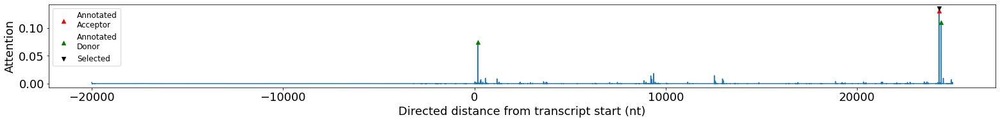

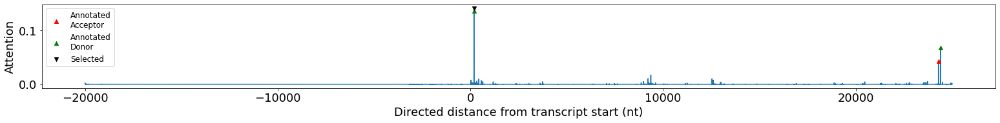

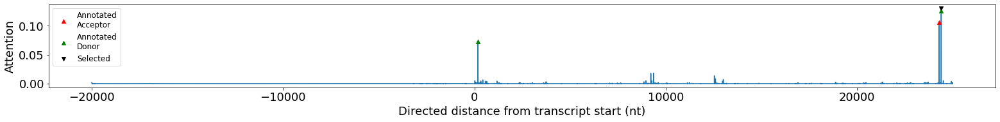

  3%|███████▍                                                                                                                                                                                                                                                                                  | 1/38 [00:02<01:26,  2.34s/it]

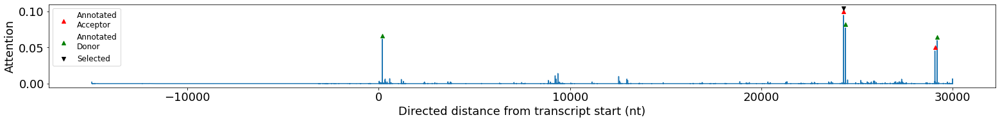

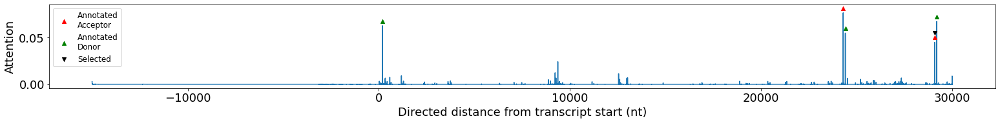

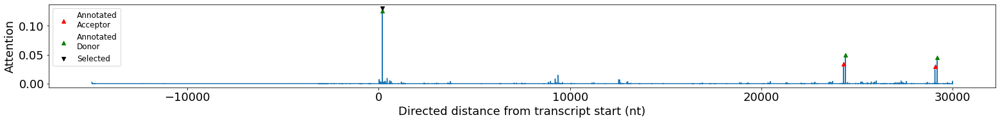

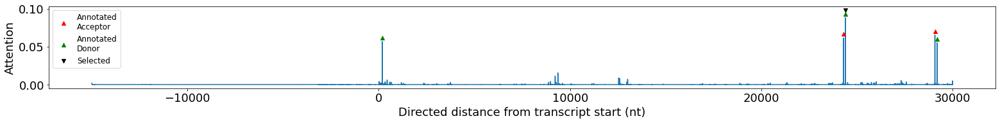

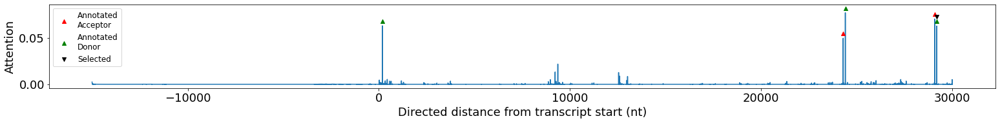

  5%|██████████████▊                                                                                                                                                                                                                                                                           | 2/38 [00:05<01:39,  2.77s/it]

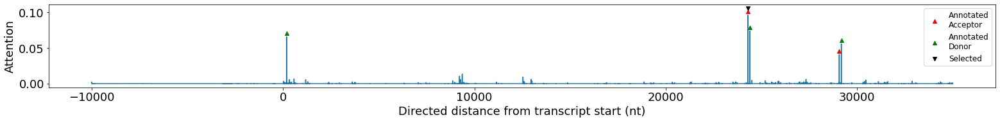

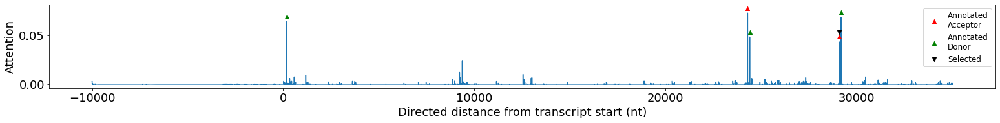

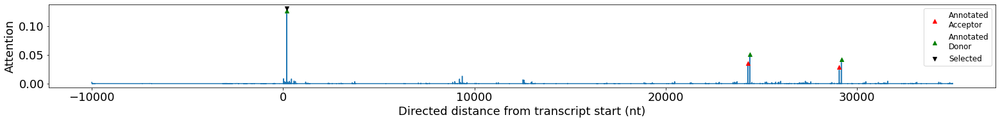

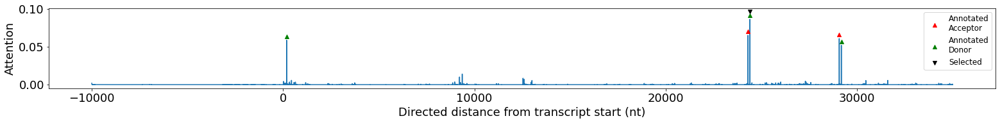

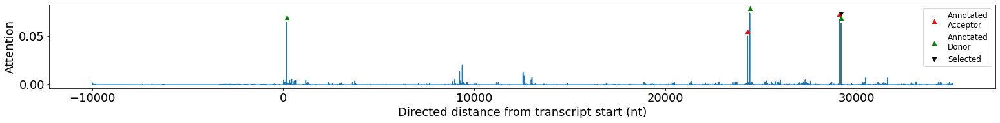

  8%|██████████████████████▎                                                                                                                                                                                                                                                                   | 3/38 [00:08<01:40,  2.88s/it]

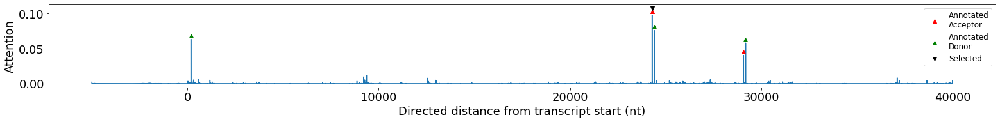

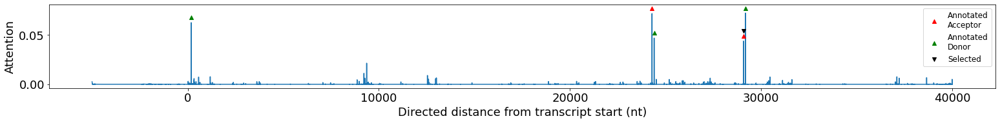

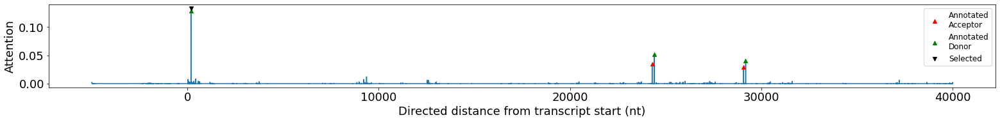

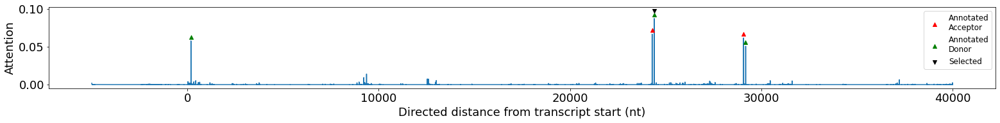

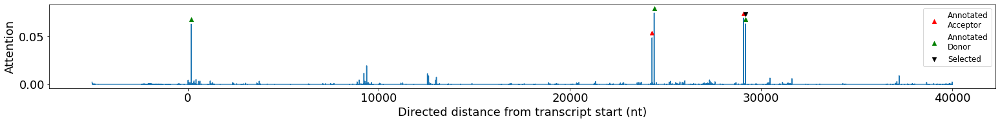

 11%|█████████████████████████████▋                                                                                                                                                                                                                                                            | 4/38 [00:11<01:39,  2.94s/it]

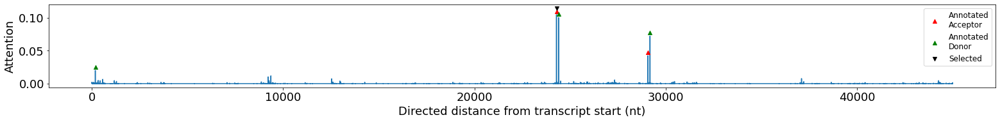

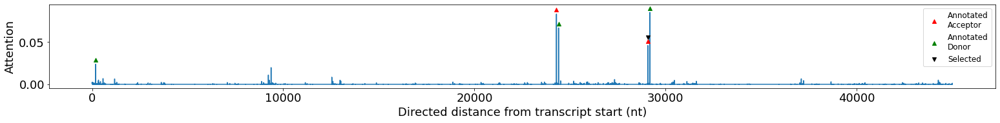

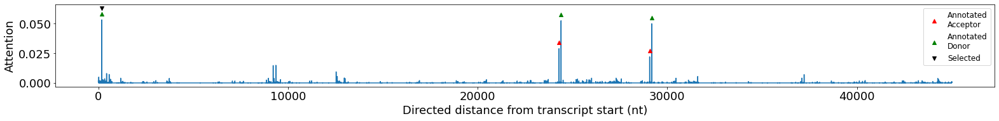

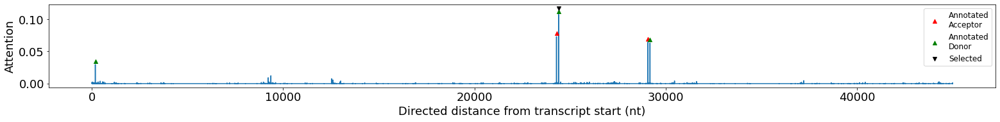

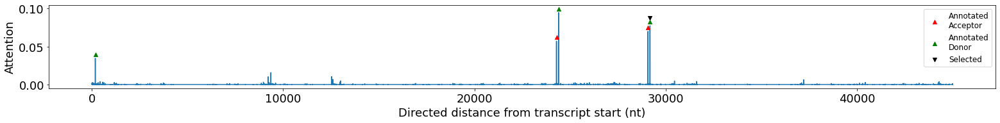

 13%|█████████████████████████████████████                                                                                                                                                                                                                                                     | 5/38 [00:14<01:39,  3.00s/it]

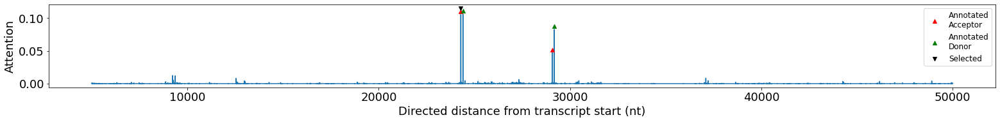

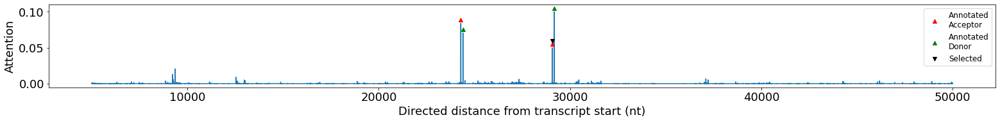

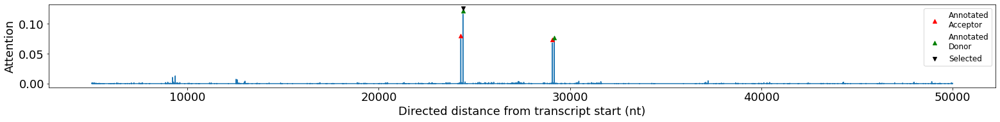

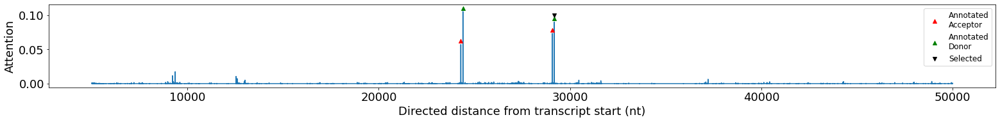

 16%|████████████████████████████████████████████▌                                                                                                                                                                                                                                             | 6/38 [00:17<01:29,  2.81s/it]

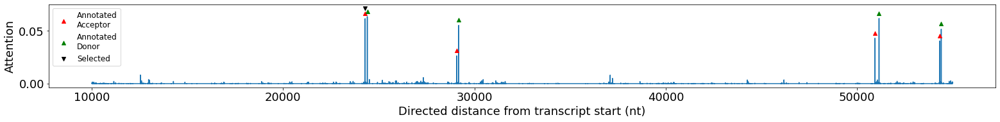

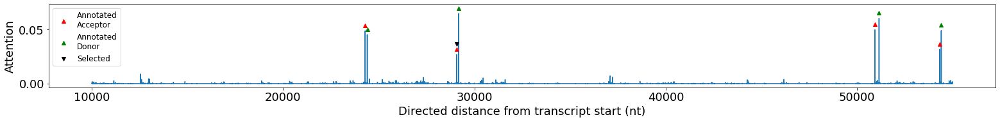

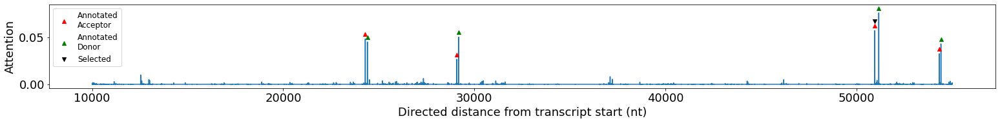

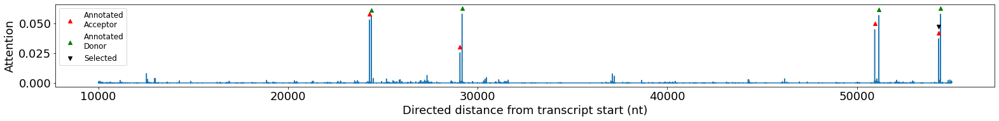

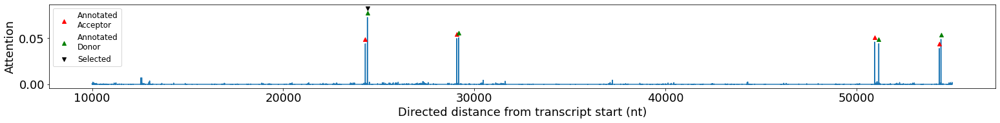

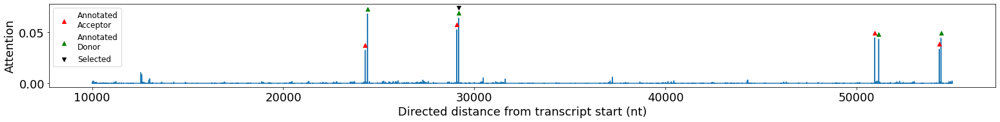

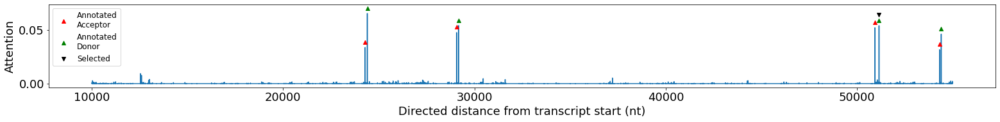

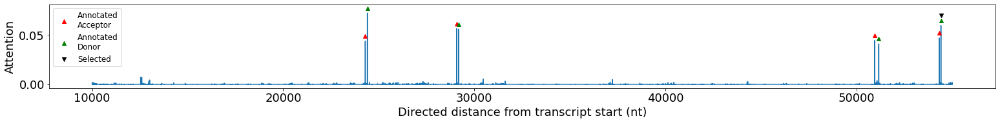

 18%|███████████████████████████████████████████████████▉                                                                                                                                                                                                                                      | 7/38 [00:21<01:47,  3.46s/it]

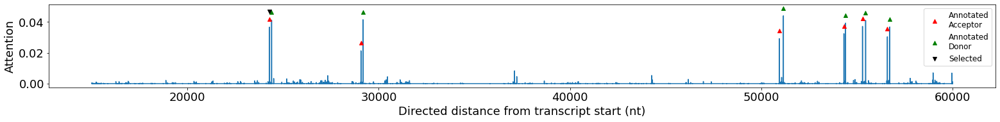

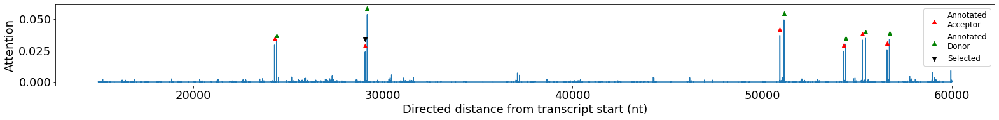

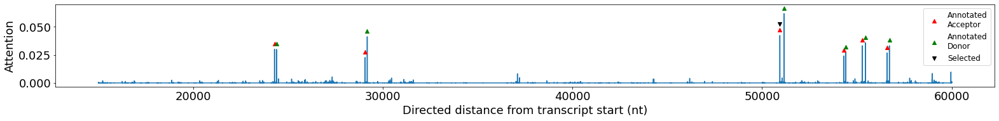

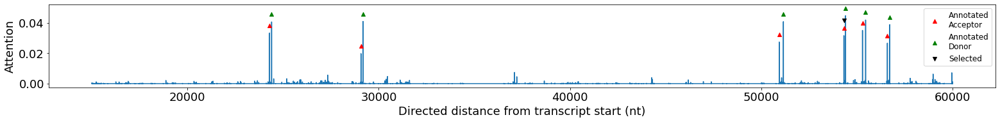

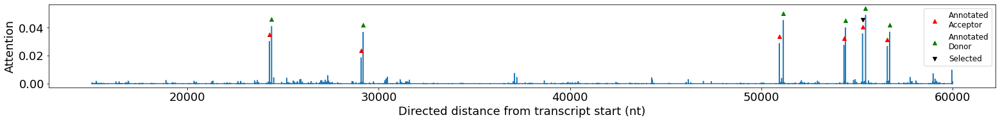

...

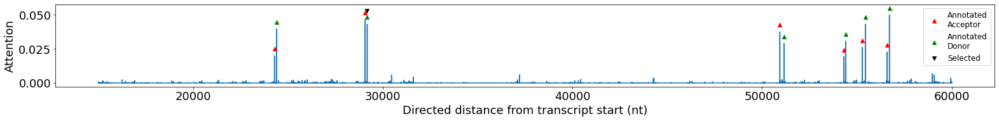

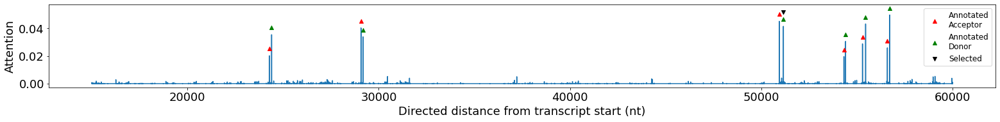

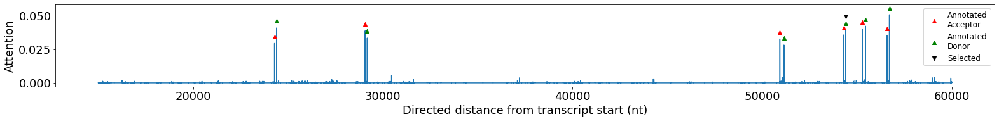

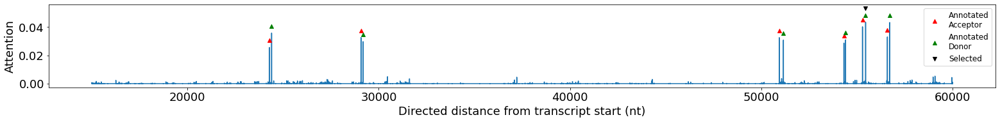

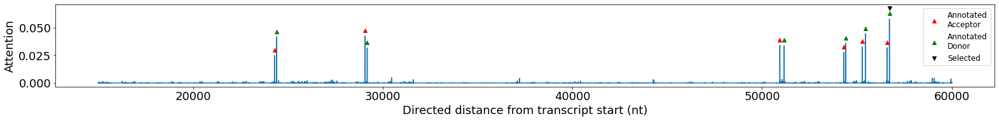

 21%|███████████████████████████████████████████████████████████▎                                                                                                                                                                                                                              | 8/38 [00:28<02:18,  4.62s/it]

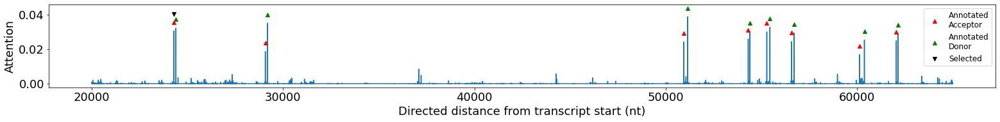

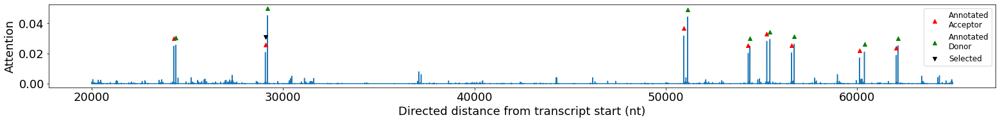

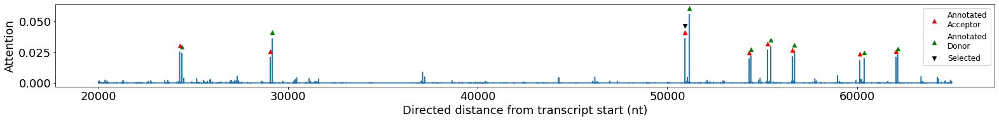

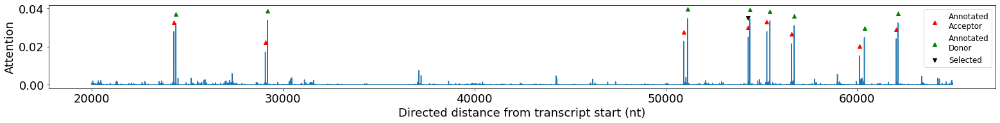

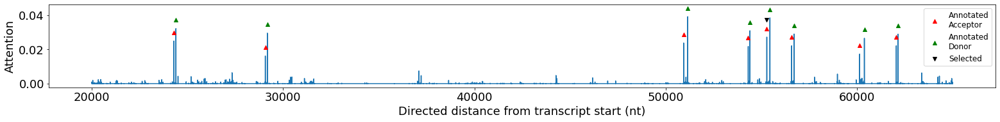

...

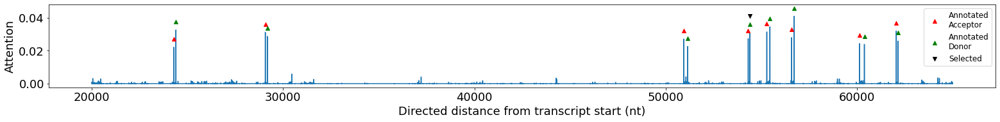

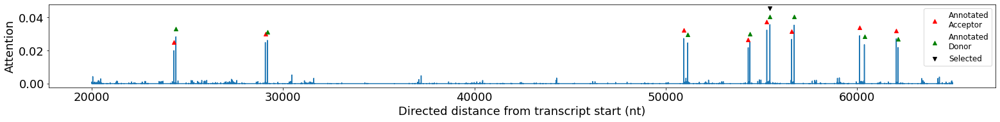

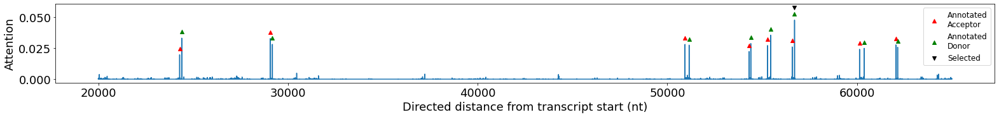

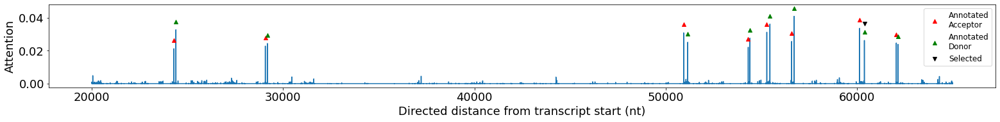

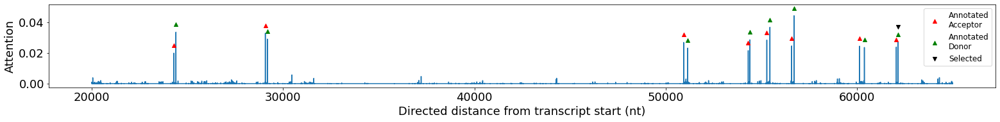

 24%|██████████████████████████████████████████████████████████████████▊                                                                                                                                                                                                                       | 9/38 [00:38<02:55,  6.06s/it]

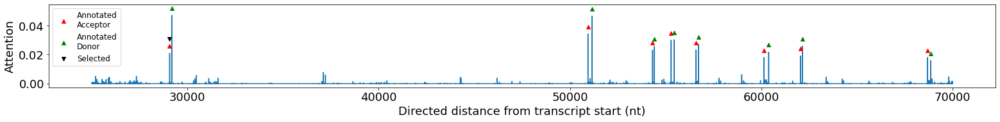

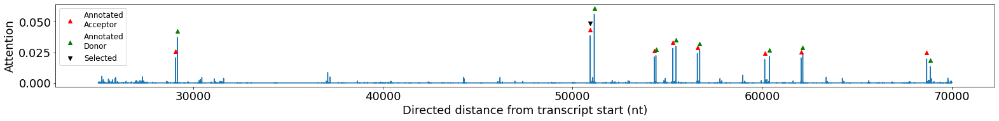

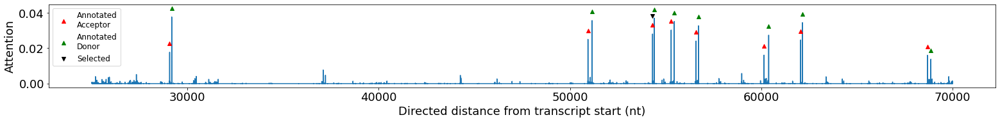

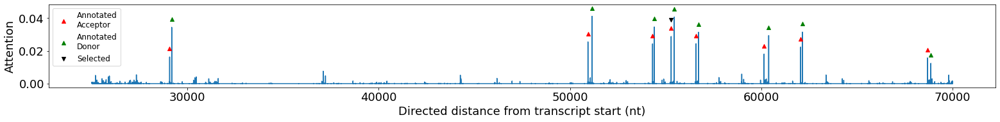

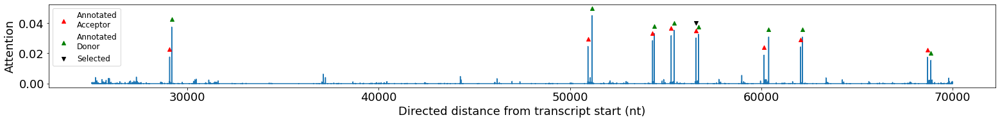

...

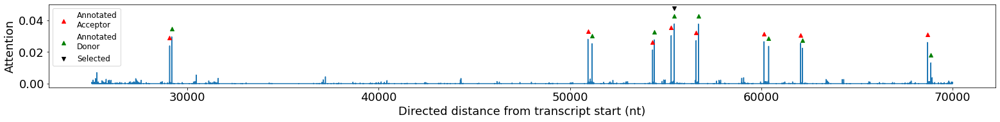

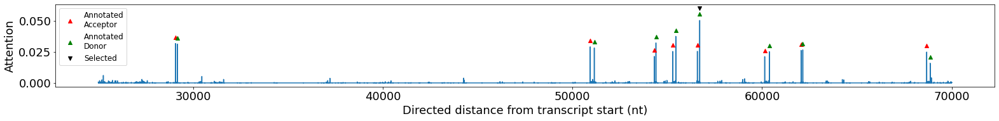

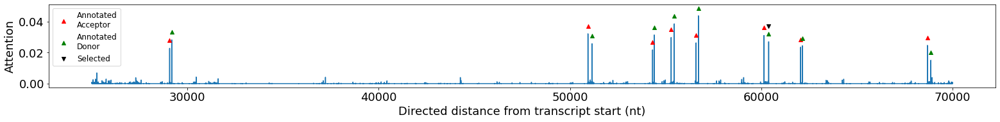

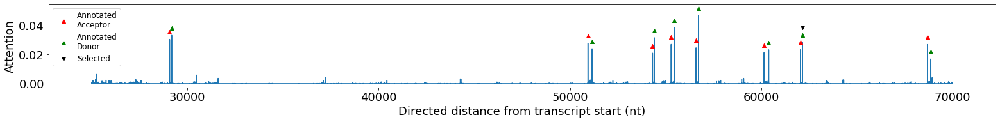

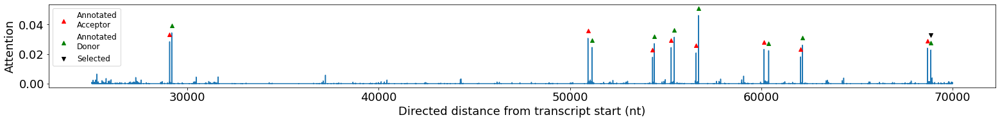

 26%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                                                               | 10/38 [00:47<03:20,  7.15s/it]

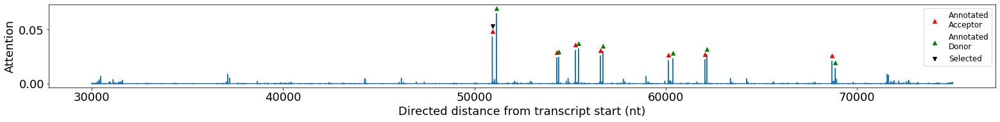

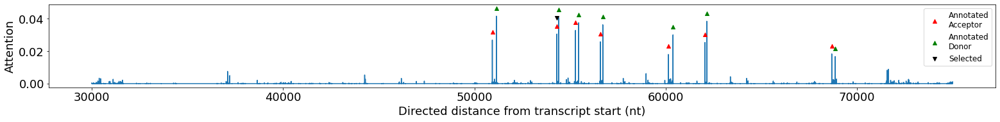

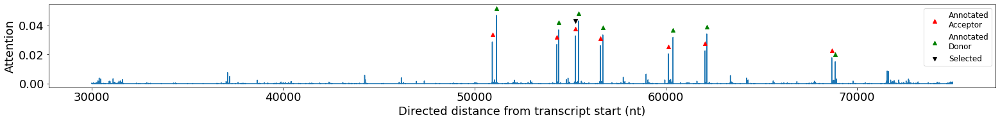

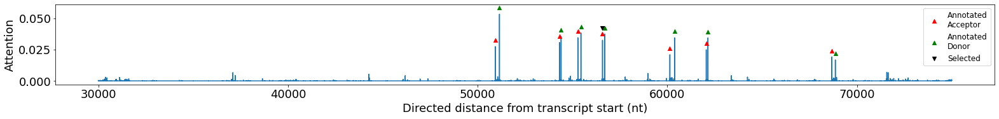

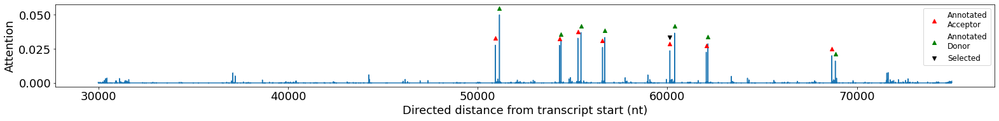

...

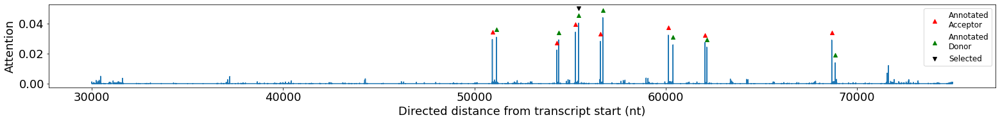

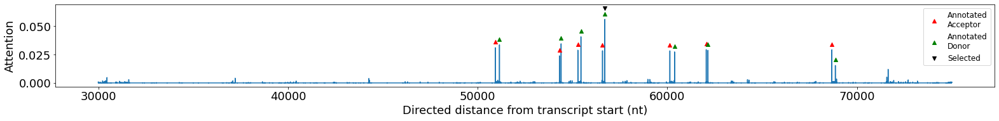

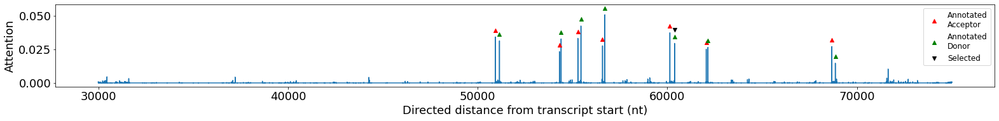

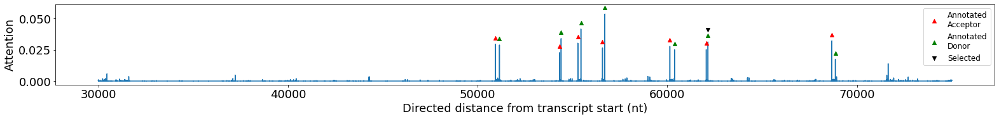

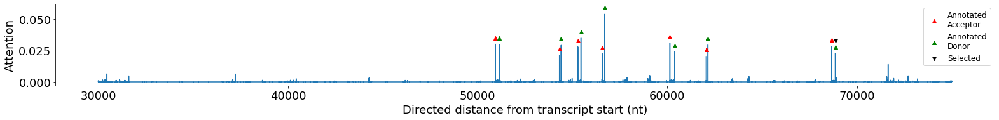

 29%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                                                       | 11/38 [00:55<03:21,  7.45s/it]

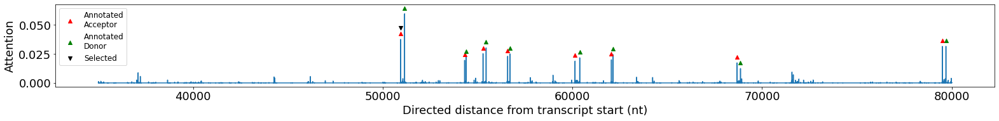

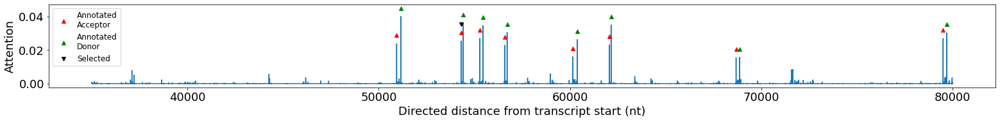

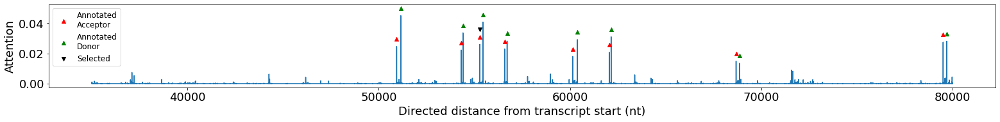

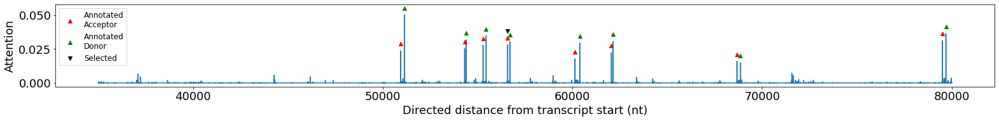

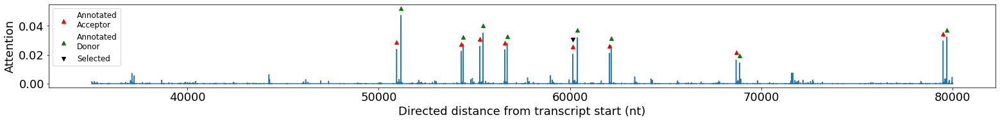

...

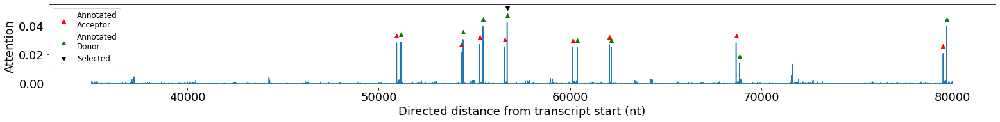

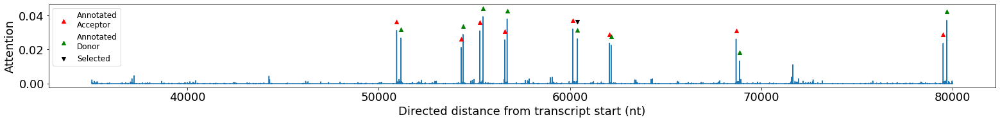

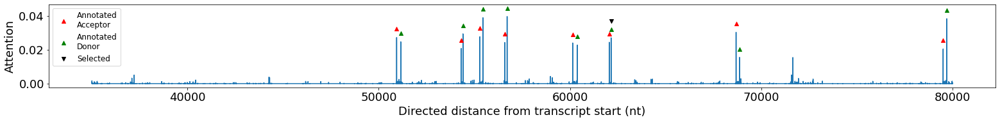

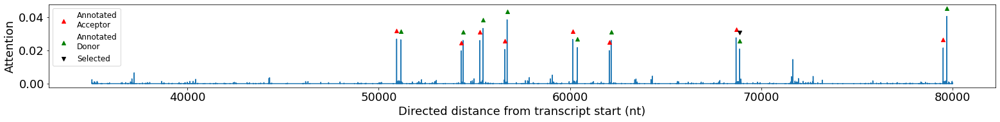

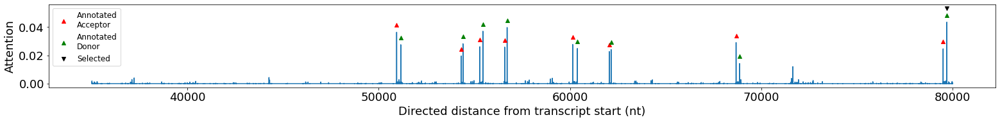

 32%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                                                | 12/38 [01:05<03:30,  8.09s/it]

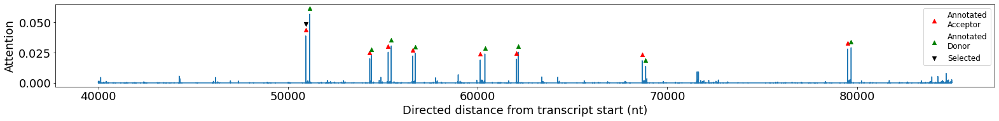

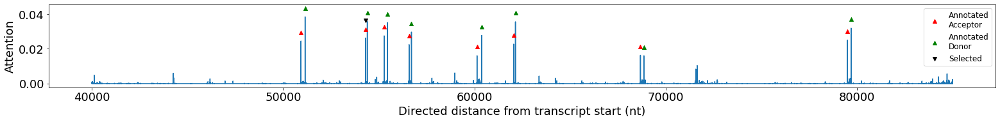

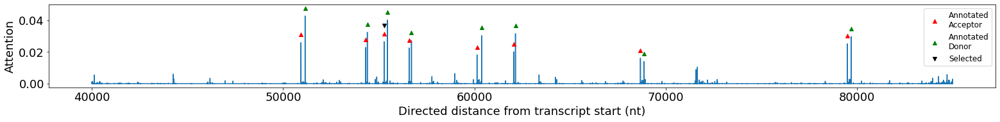

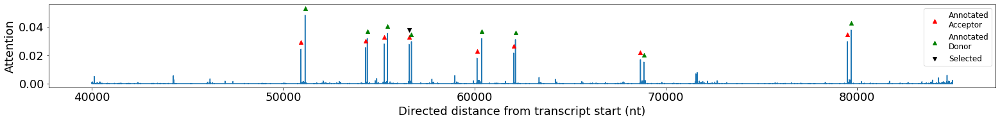

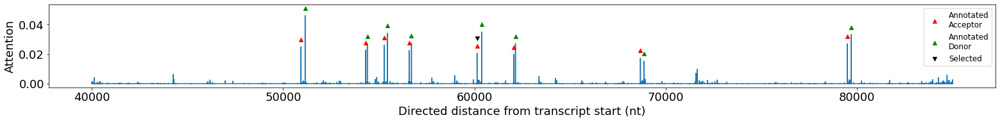

...

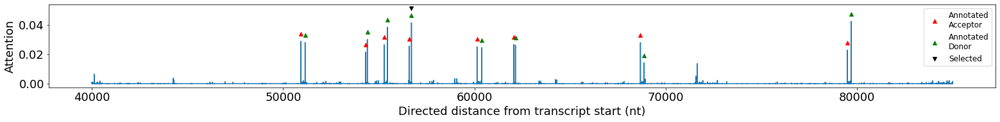

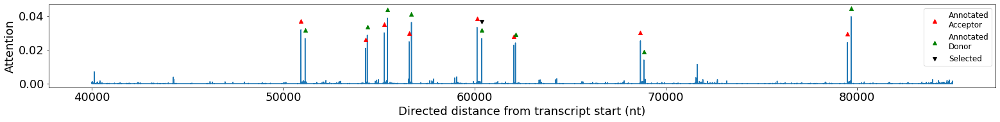

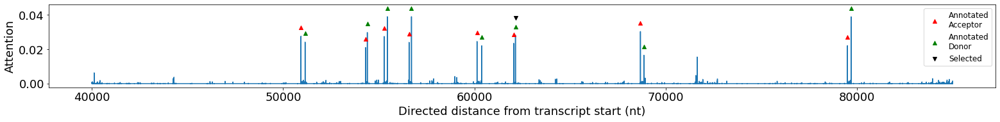

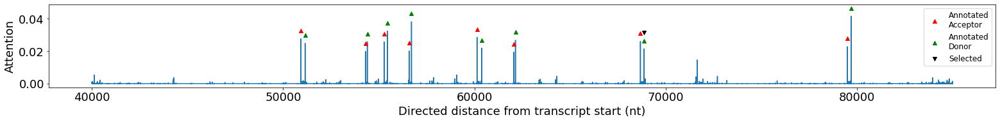

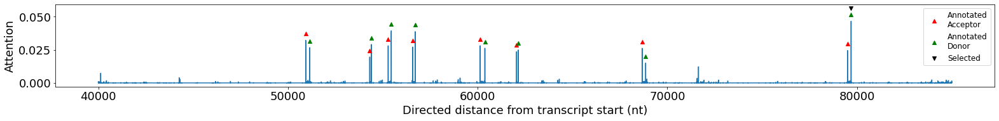

 34%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                                        | 13/38 [01:14<03:32,  8.52s/it]

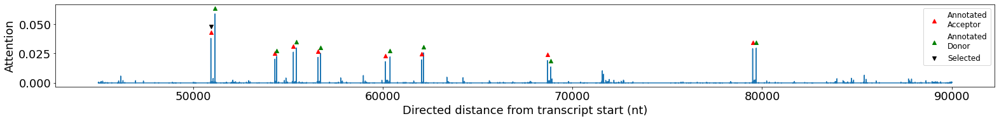

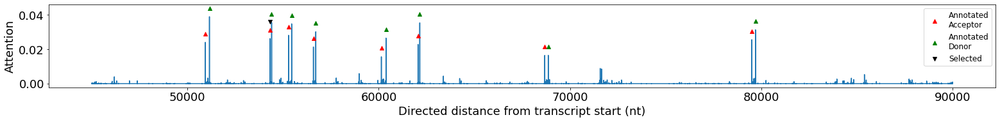

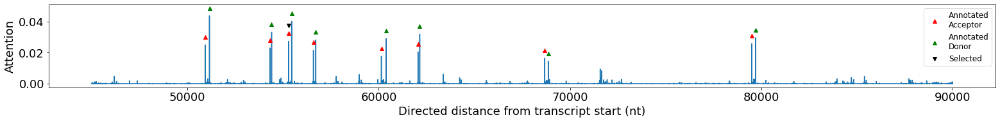

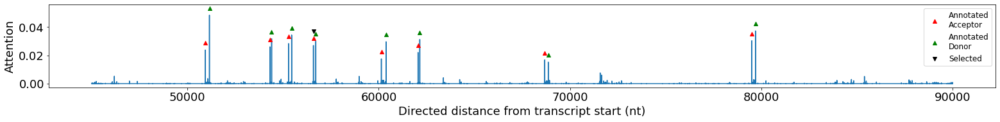

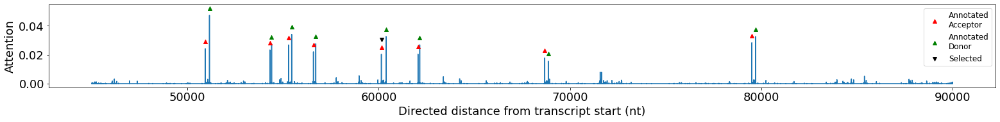

...

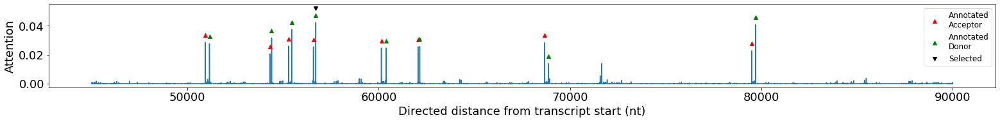

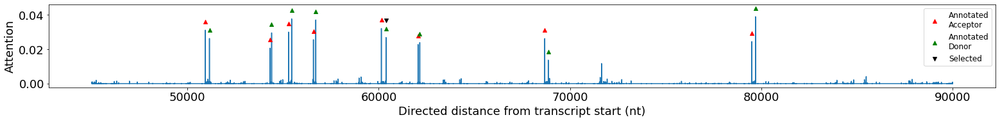

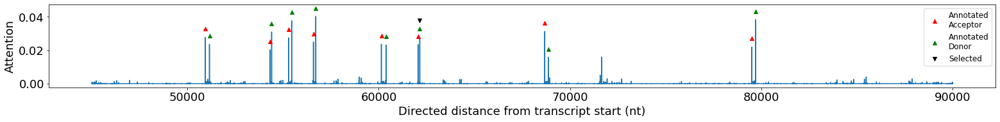

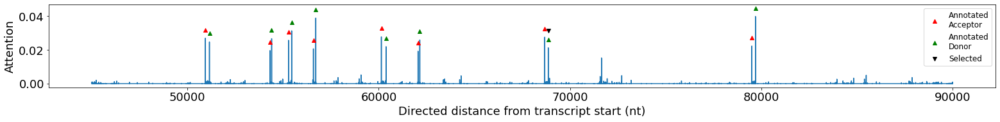

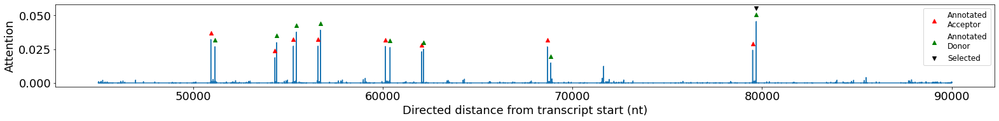

 37%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                                 | 14/38 [01:24<03:29,  8.73s/it]

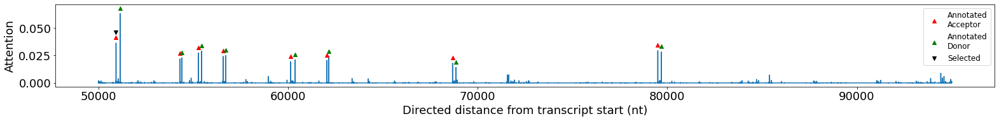

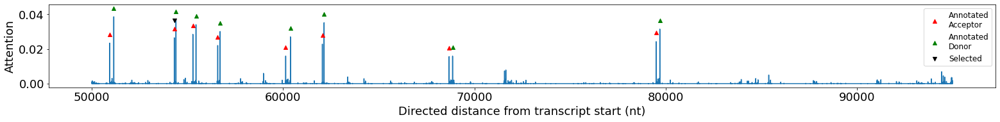

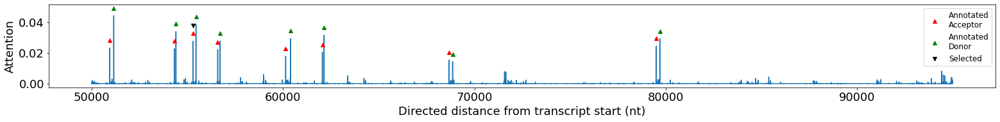

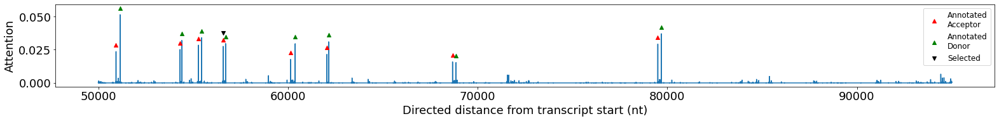

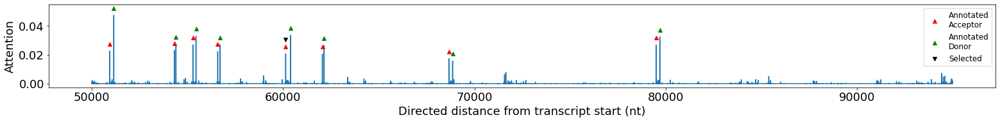

...

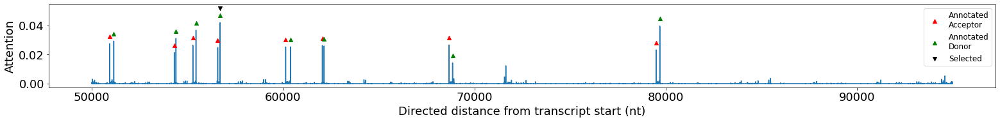

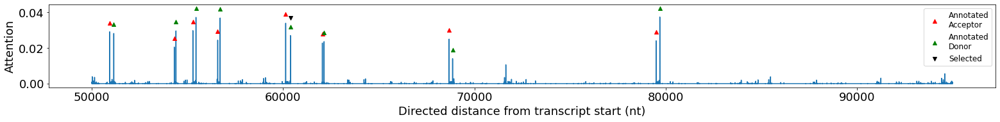

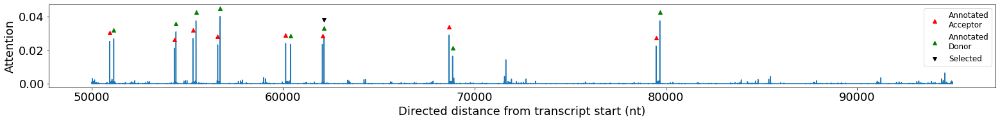

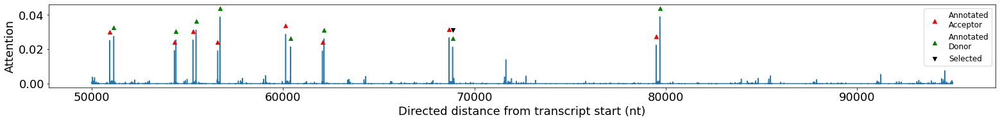

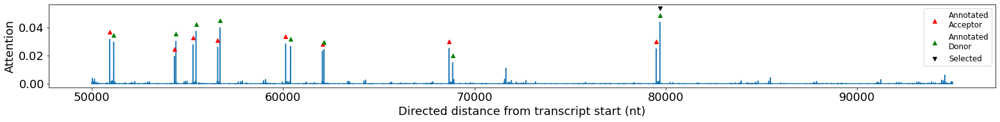

 39%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                          | 15/38 [01:33<03:24,  8.90s/it]

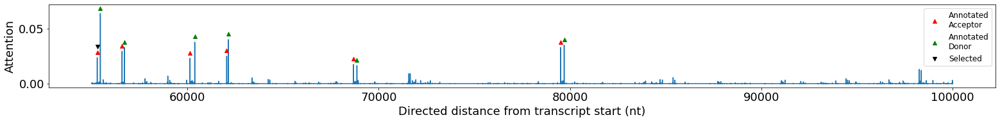

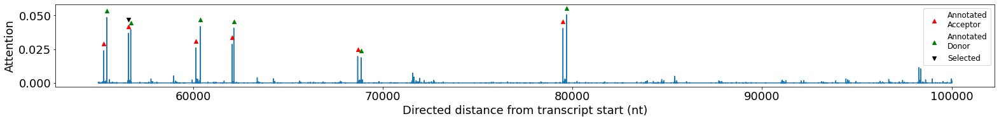

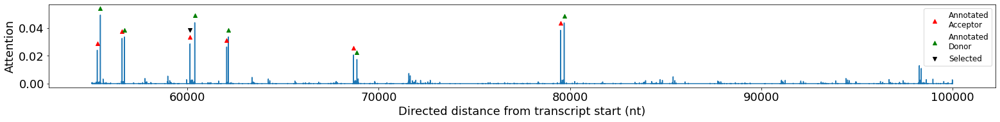

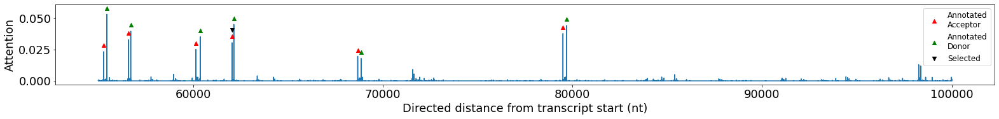

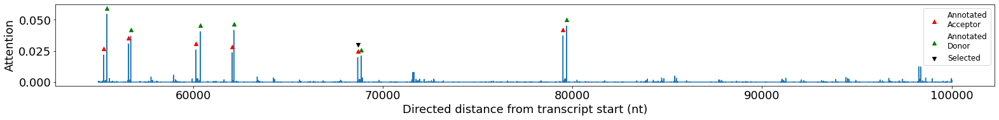

...

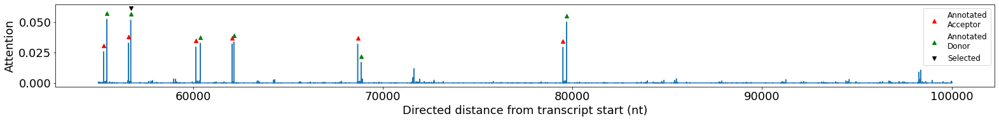

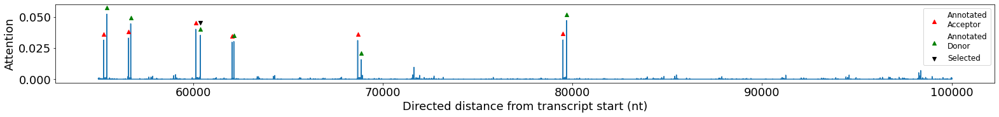

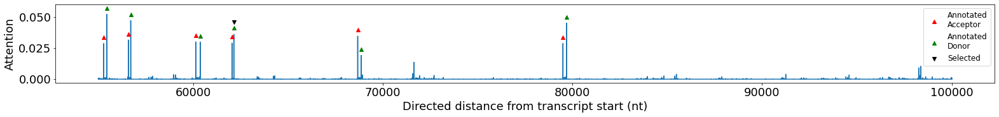

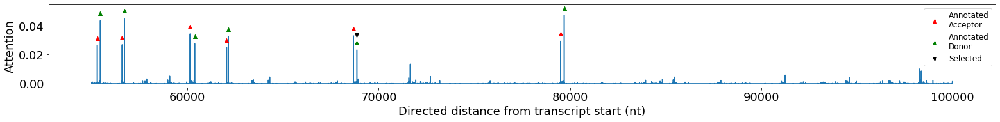

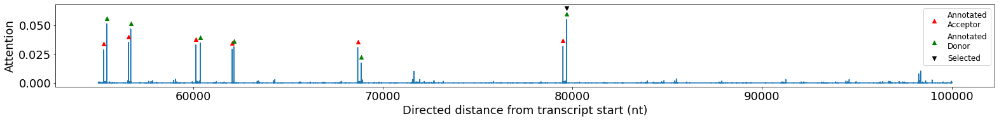

 42%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                  | 16/38 [01:40<03:03,  8.35s/it]

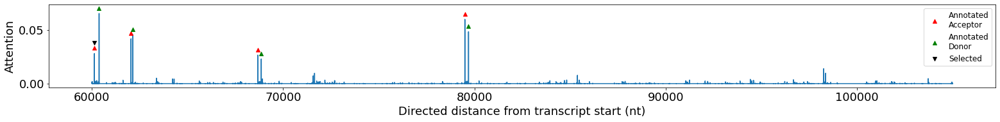

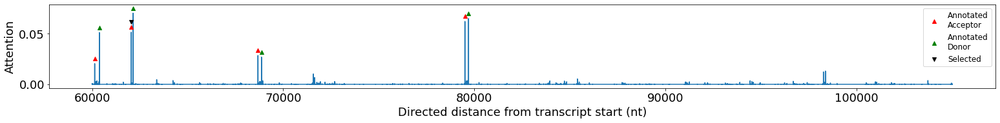

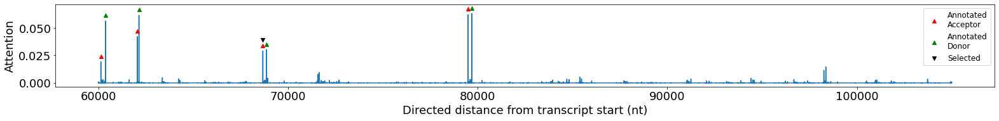

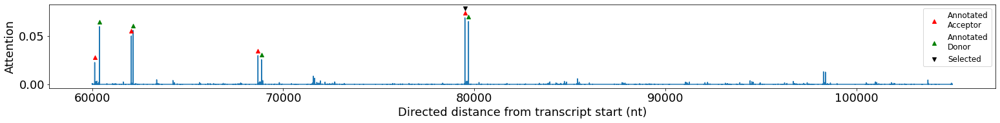

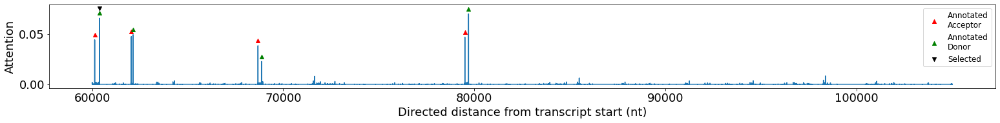

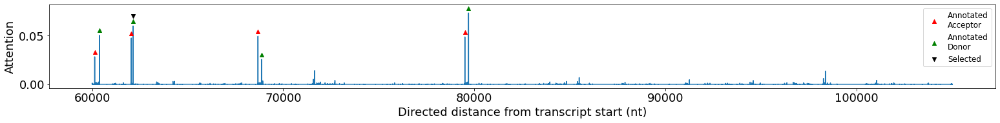

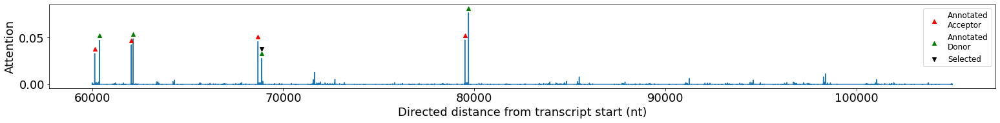

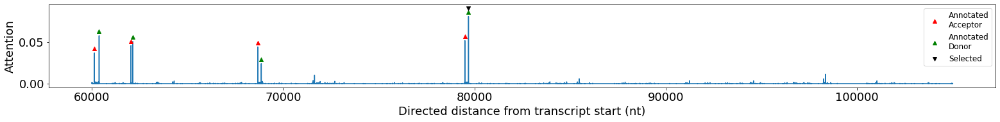

 45%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                           | 17/38 [01:45<02:32,  7.25s/it]

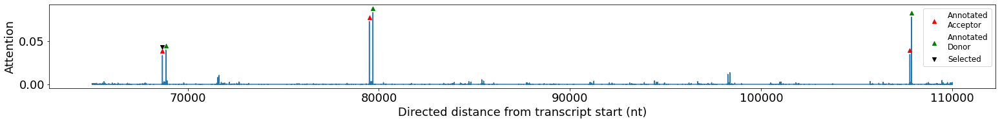

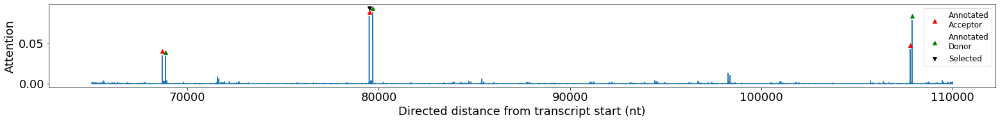

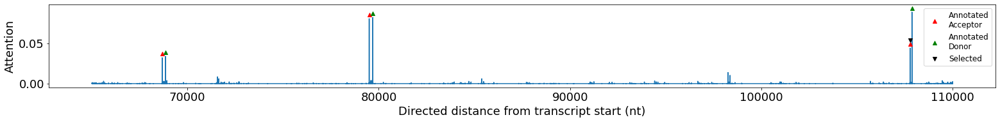

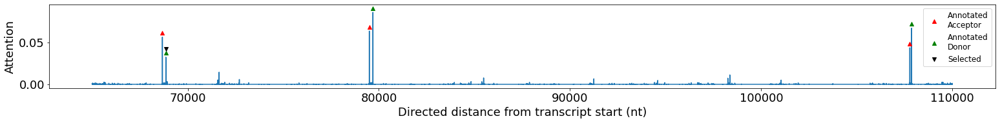

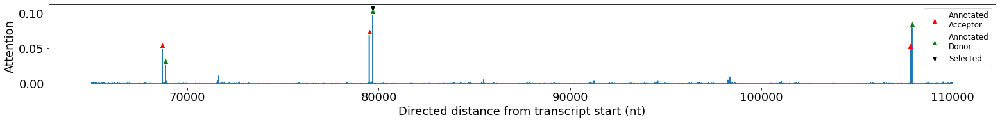

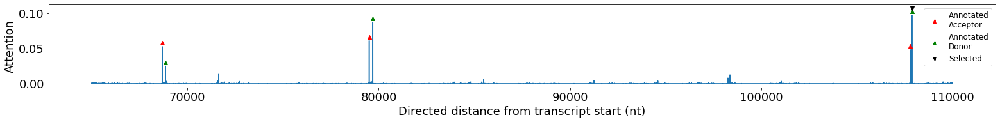

 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                    | 18/38 [01:48<02:02,  6.15s/it]

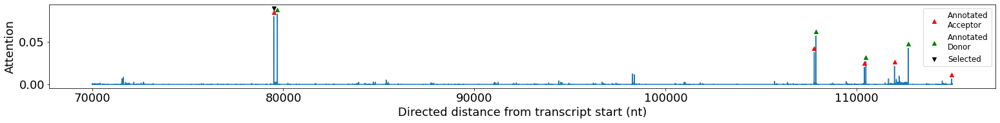

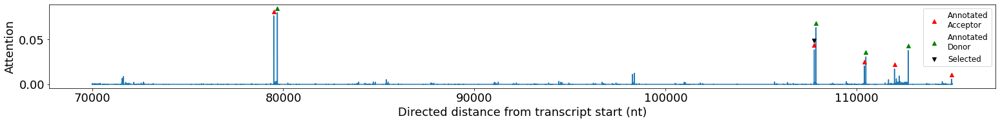

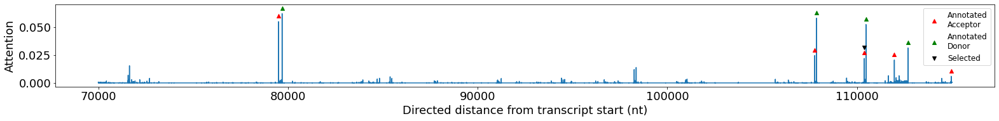

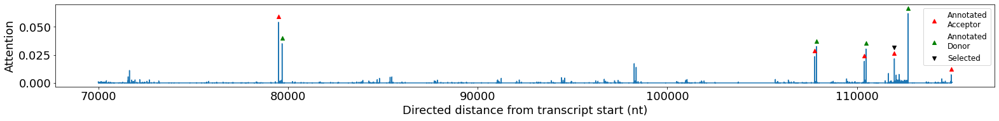

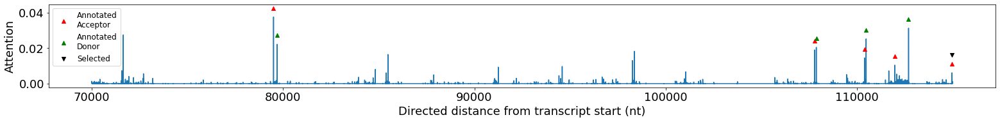

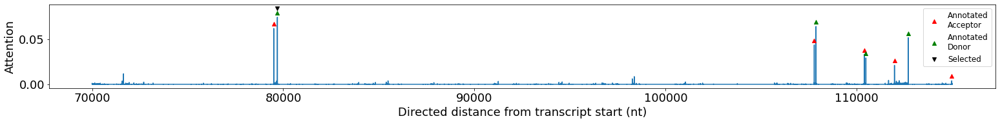

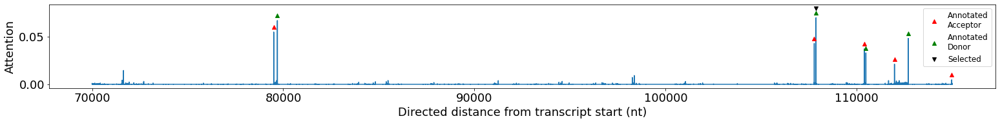

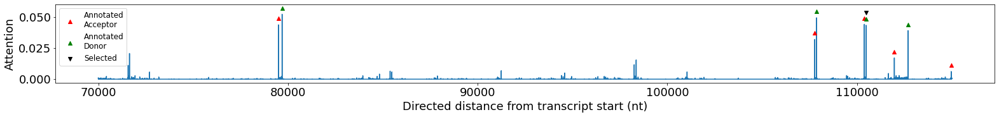

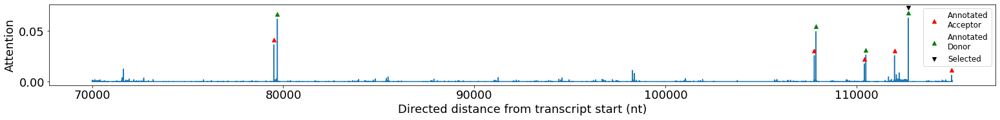

 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                            | 19/38 [01:54<01:51,  5.89s/it]

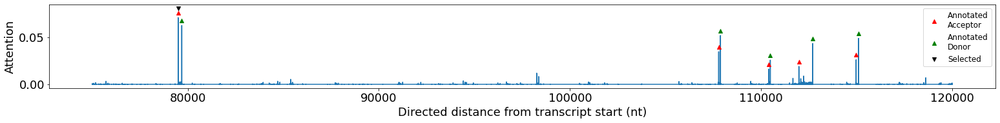

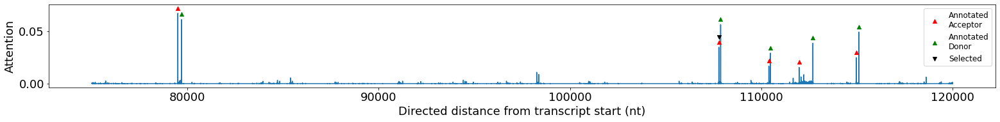

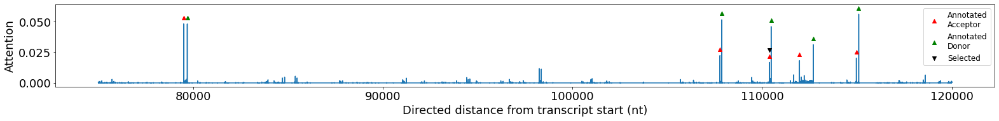

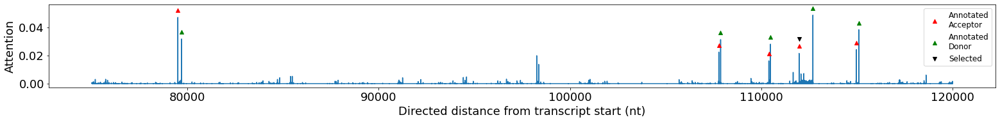

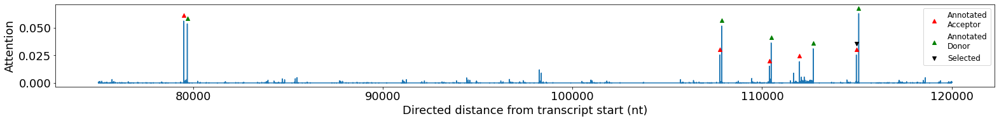

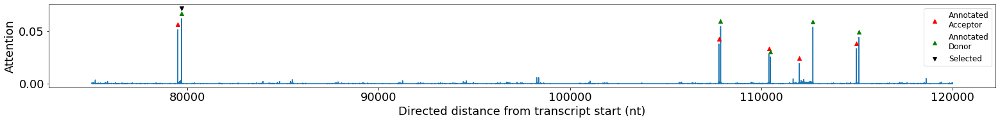

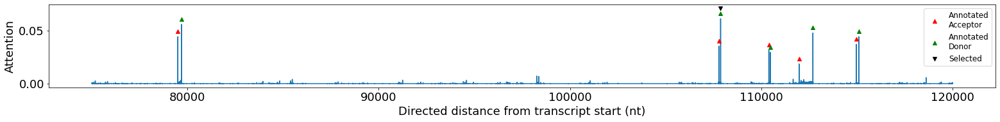

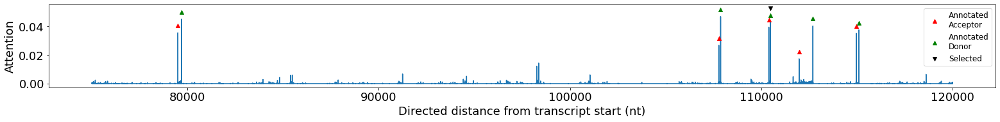

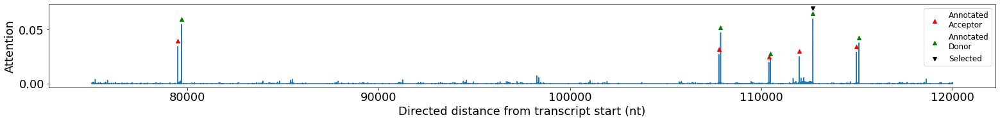

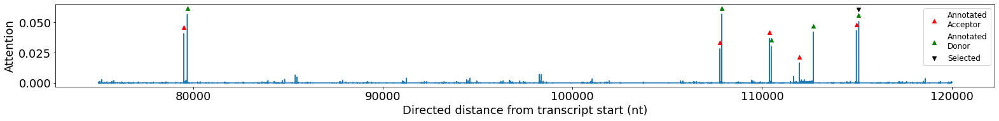

 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                     | 20/38 [02:00<01:46,  5.91s/it]

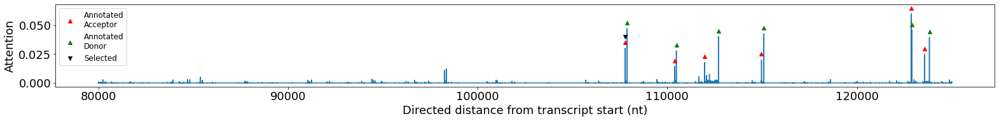

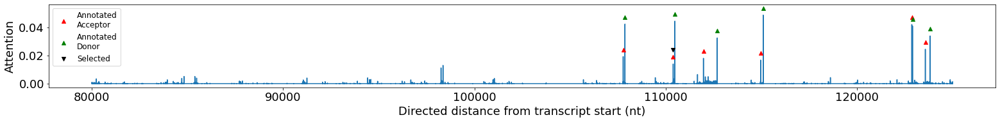

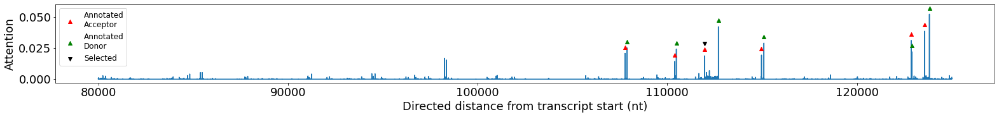

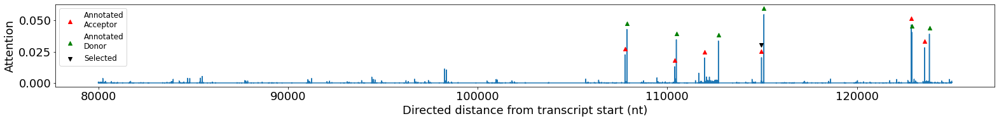

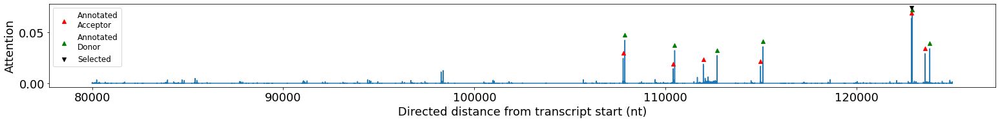

...

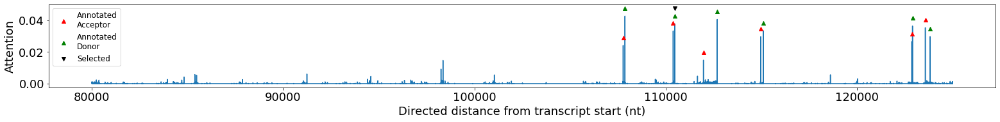

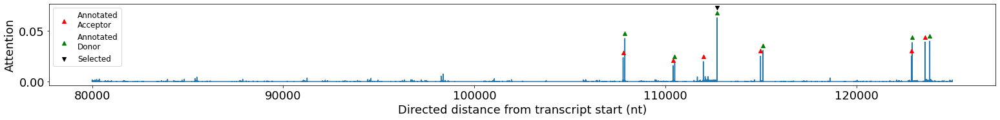

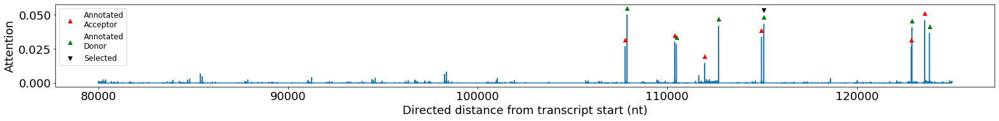

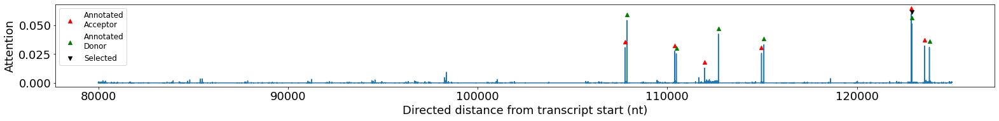

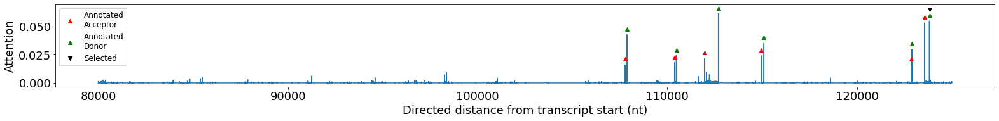

 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                             | 21/38 [02:07<01:46,  6.29s/it]

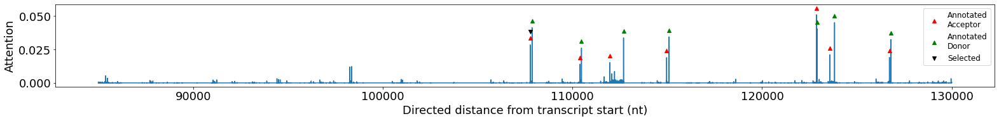

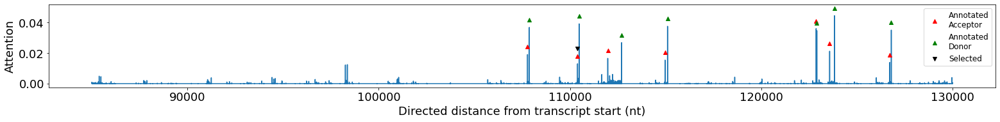

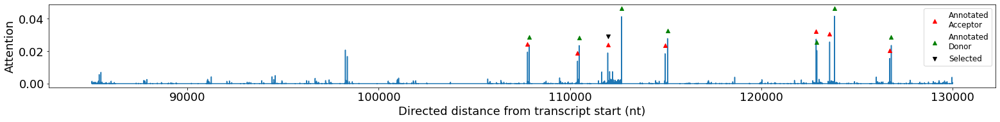

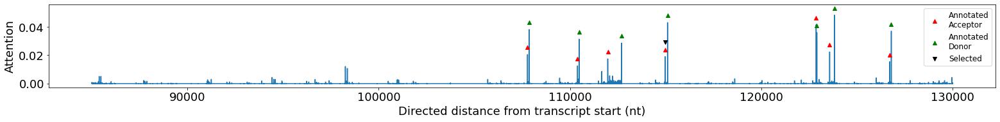

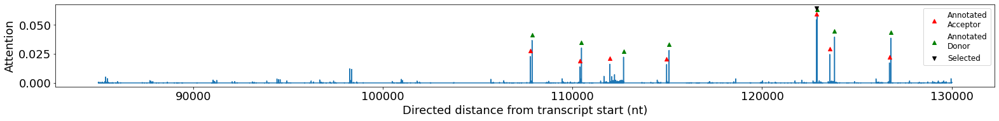

...

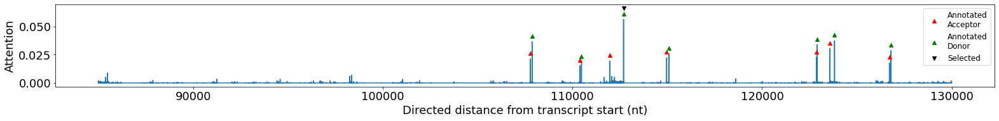

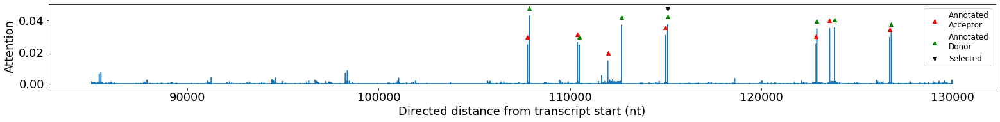

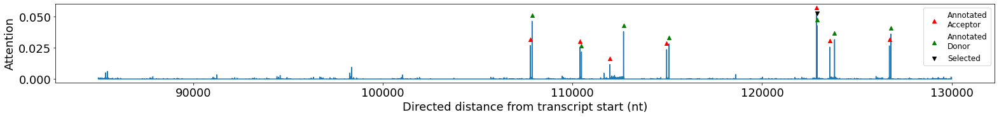

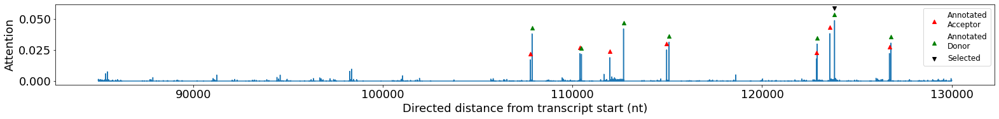

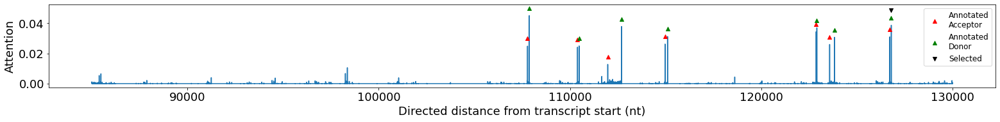

 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                      | 22/38 [02:15<01:49,  6.86s/it]

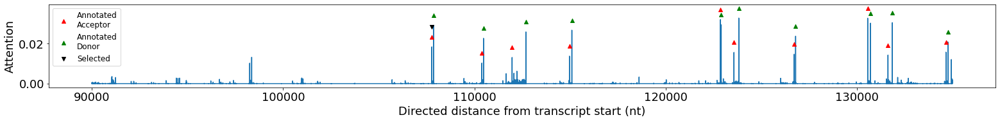

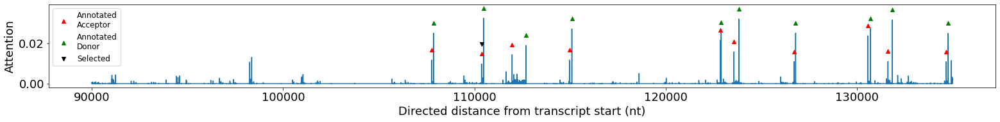

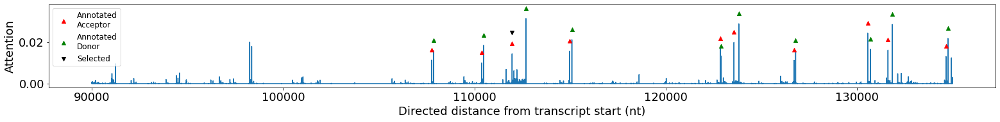

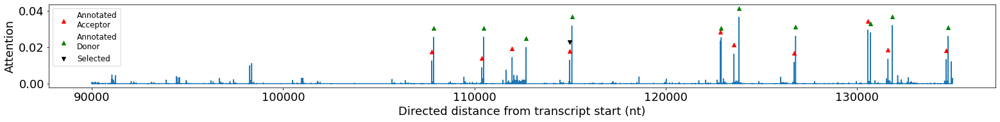

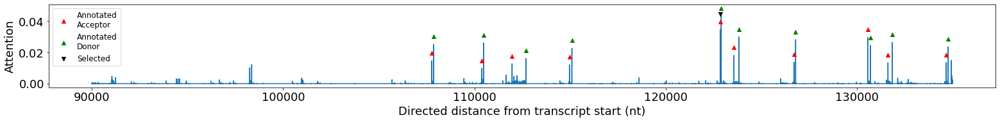

...

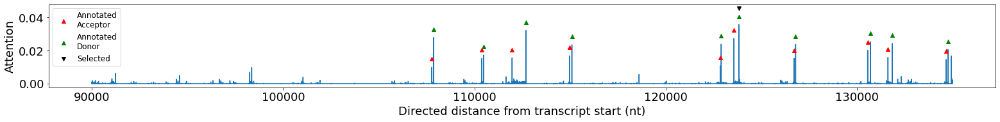

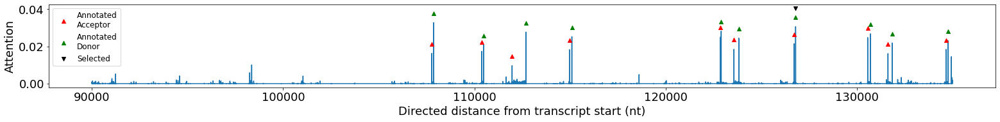

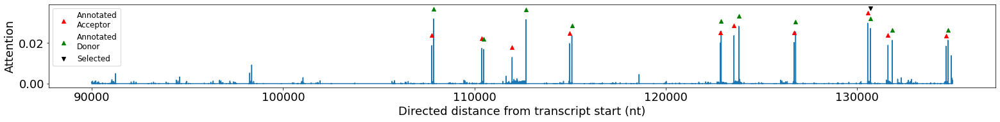

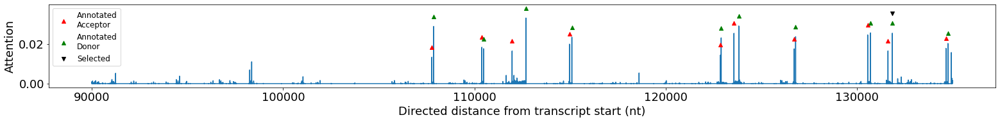

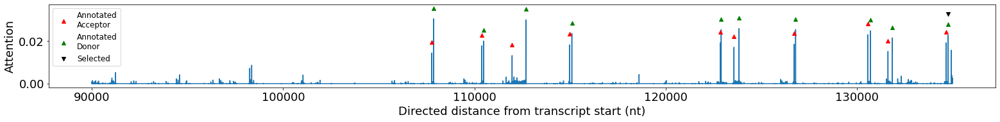

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                               | 23/38 [02:27<02:05,  8.40s/it]

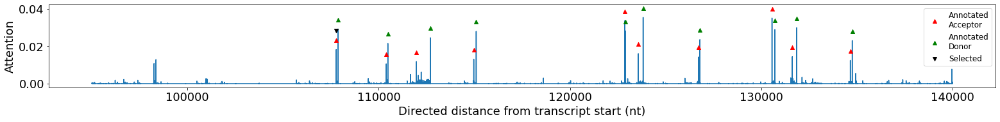

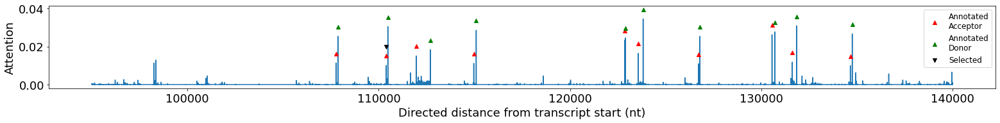

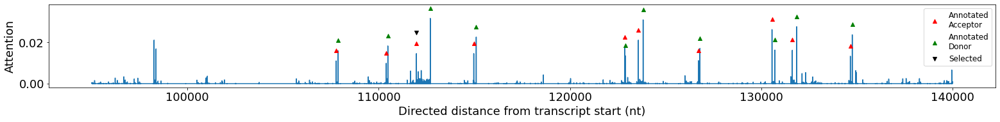

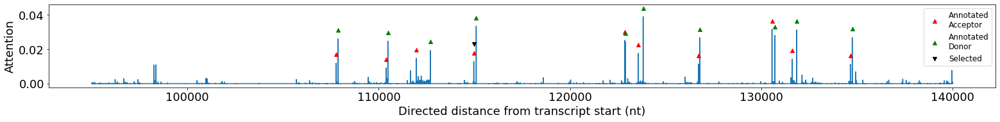

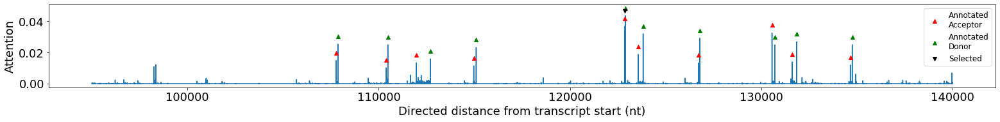

...

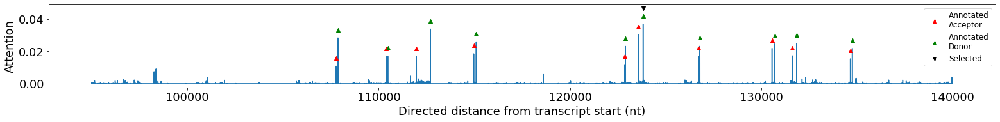

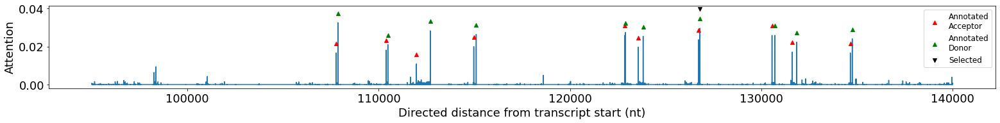

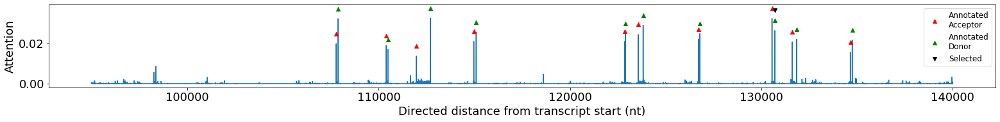

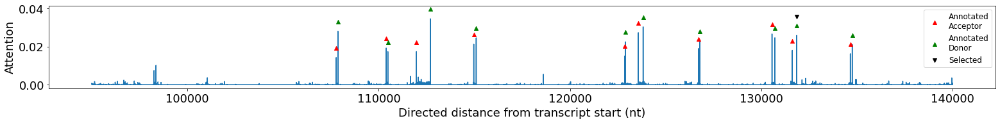

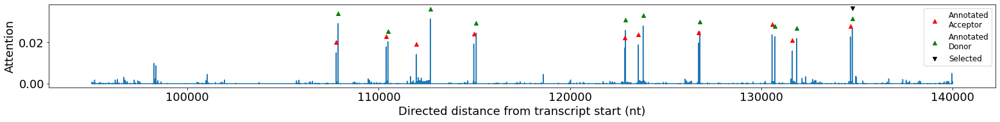

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 24/38 [02:38<02:10,  9.35s/it]

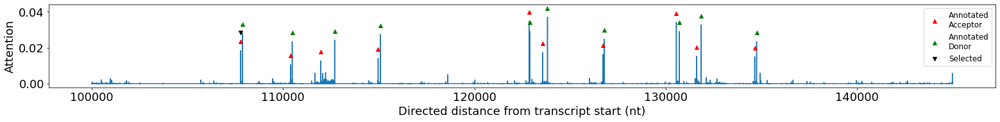

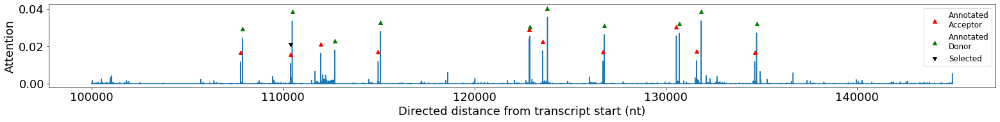

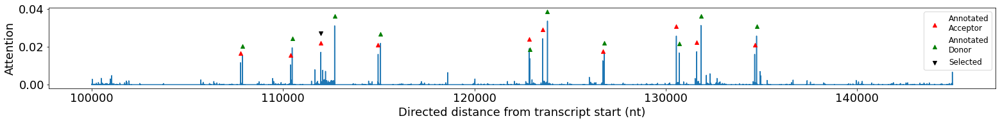

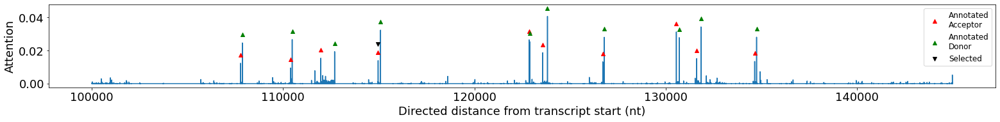

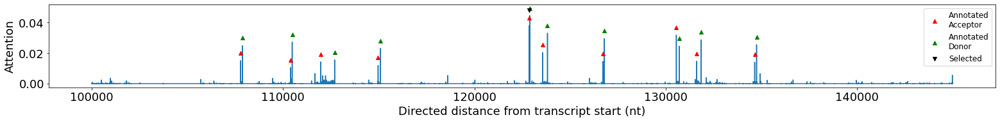

...

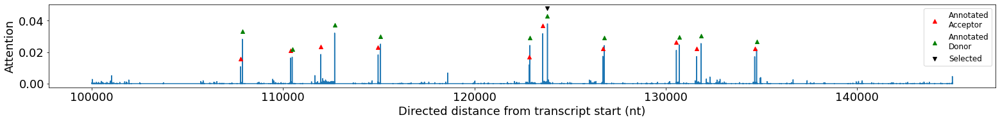

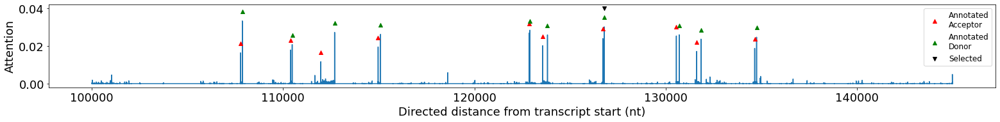

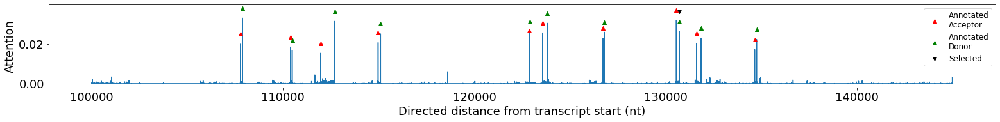

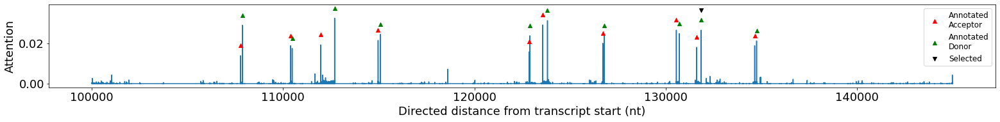

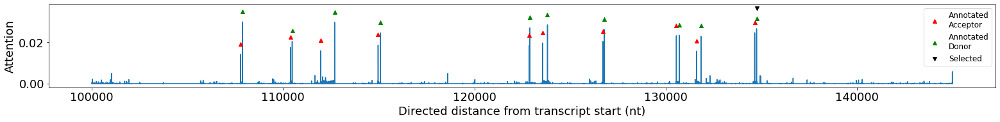

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 25/38 [02:50<02:10, 10.01s/it]

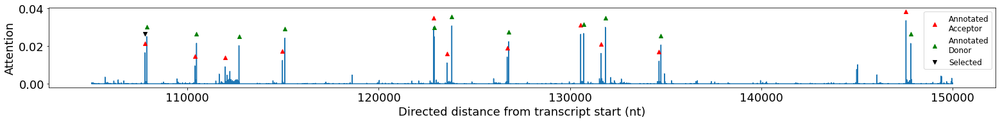

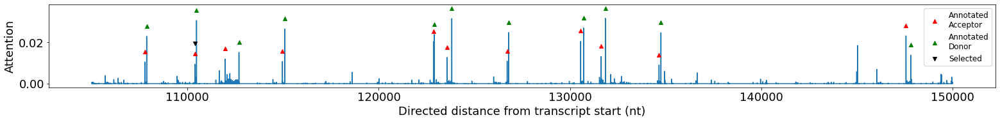

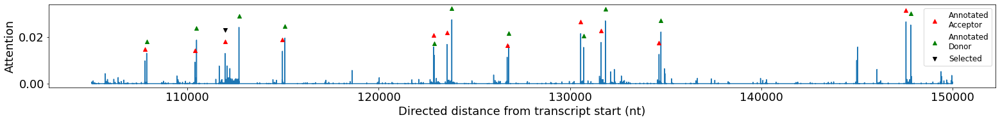

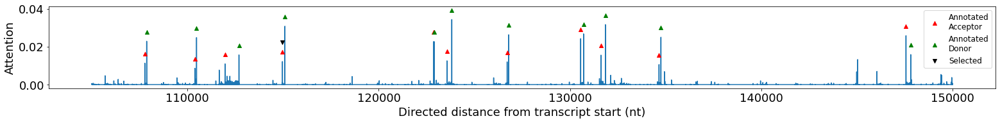

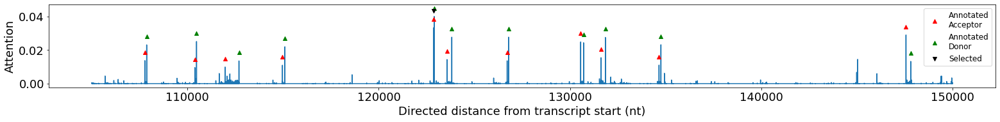

...

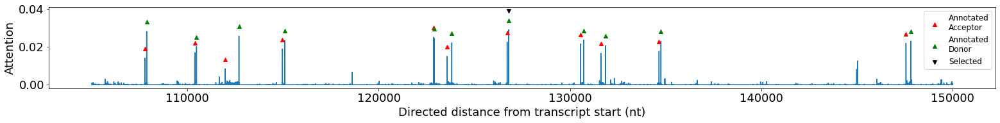

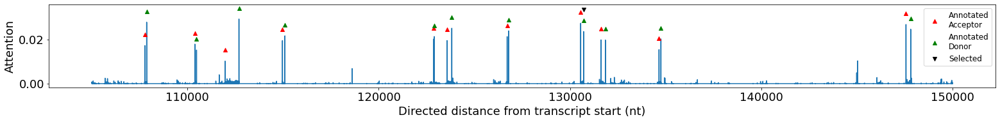

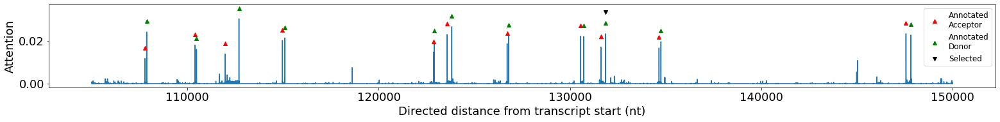

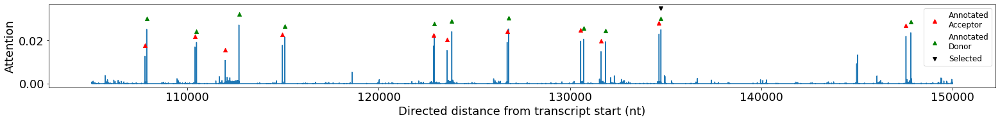

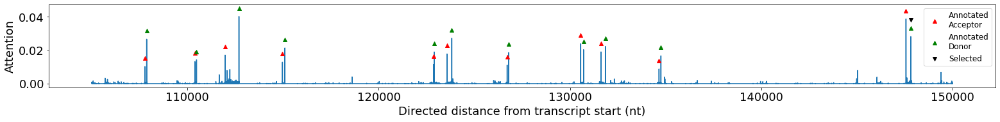

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 26/38 [03:04<02:12, 11.06s/it]

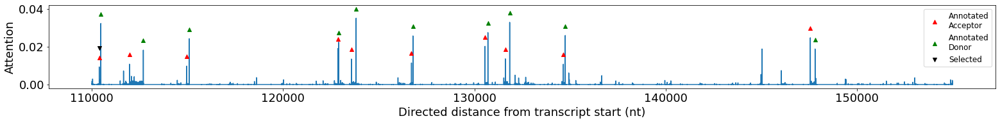

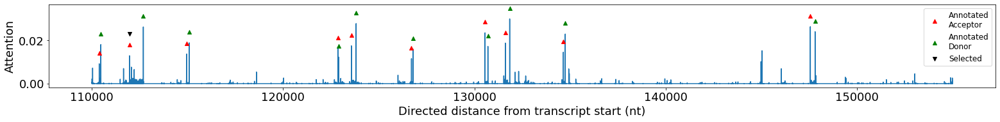

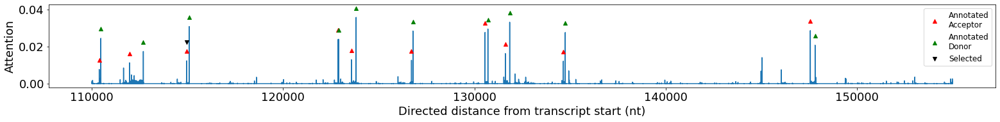

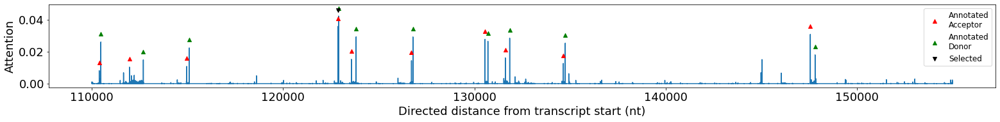

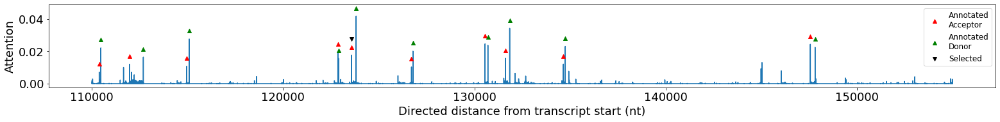

...

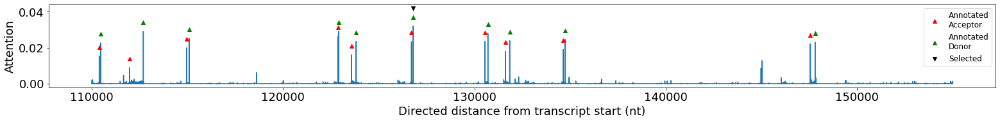

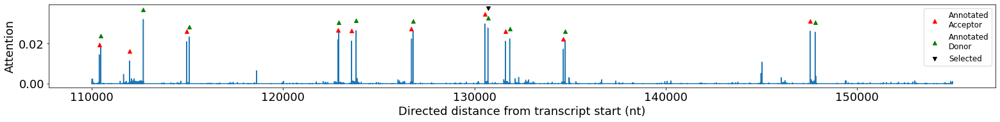

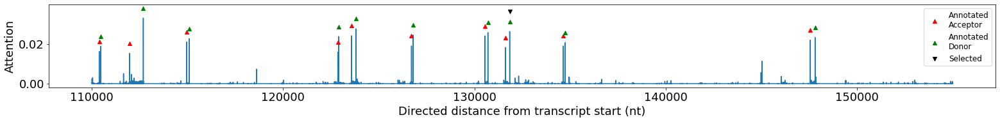

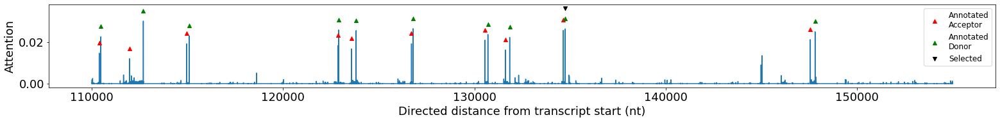

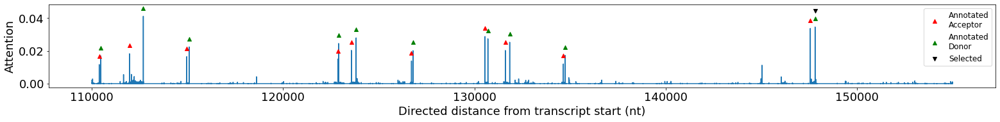

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 27/38 [03:15<02:04, 11.32s/it]

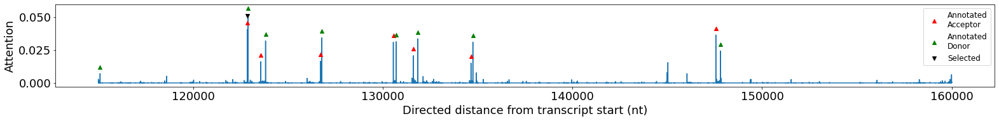

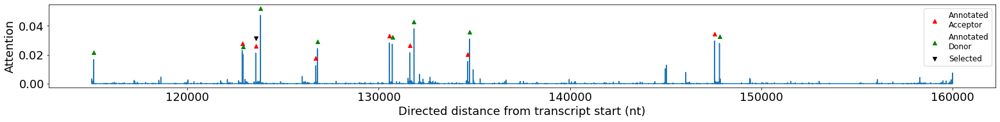

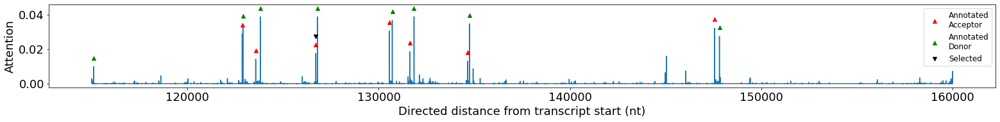

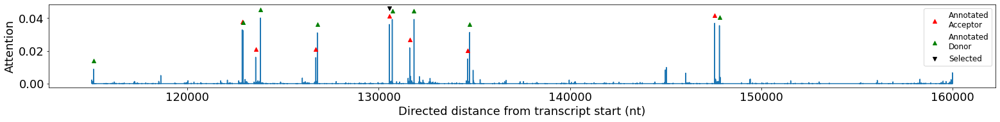

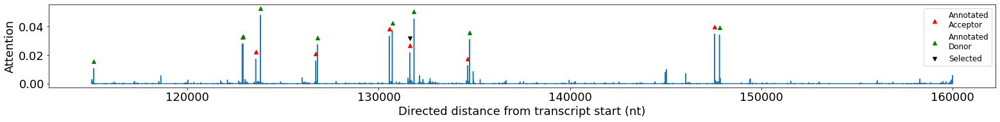

...

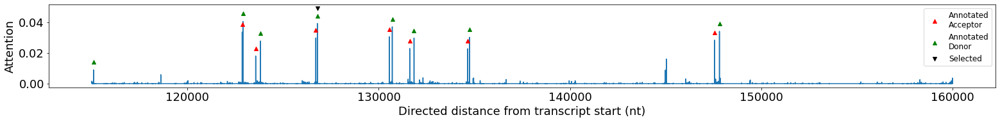

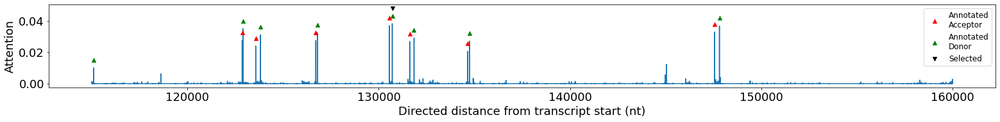

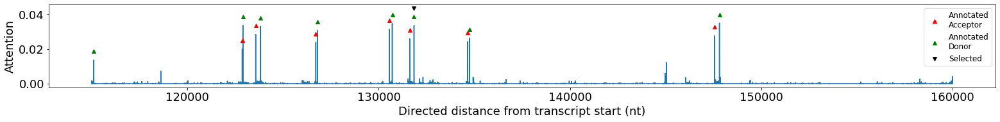

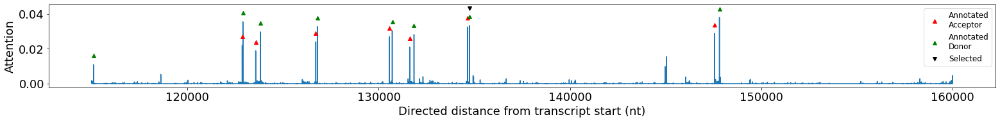

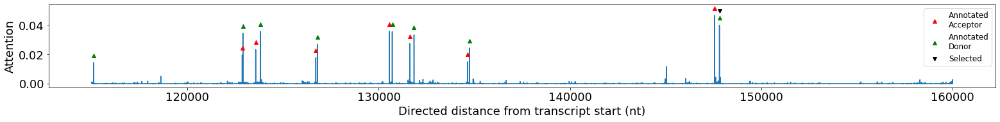

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 28/38 [03:24<01:45, 10.56s/it]

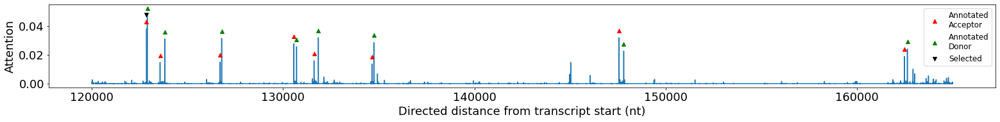

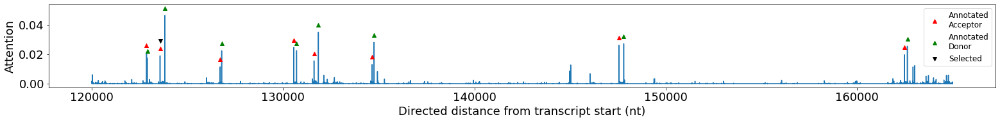

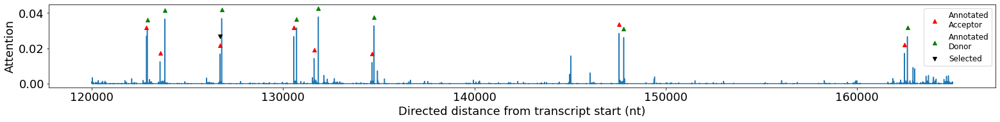

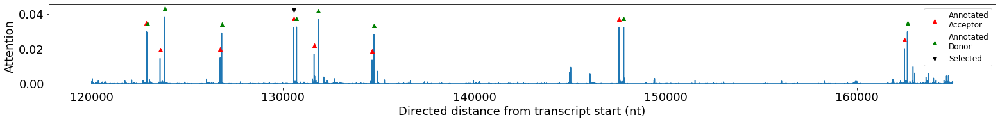

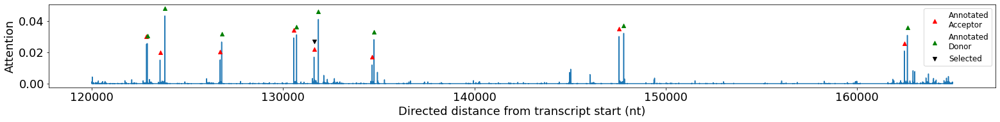

...

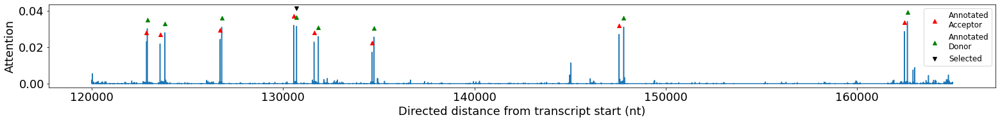

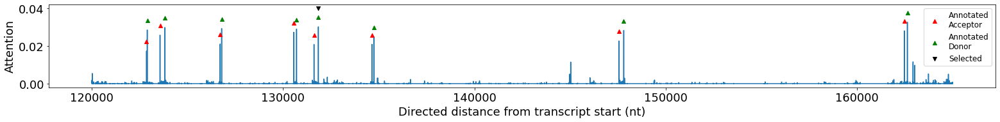

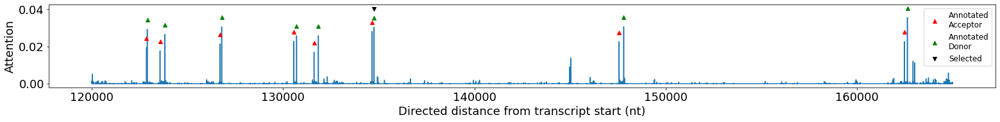

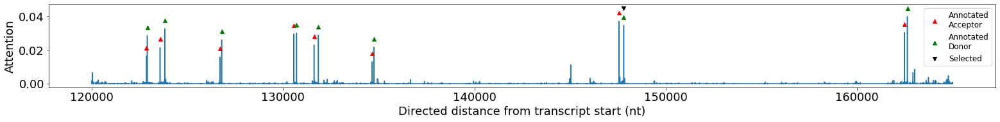

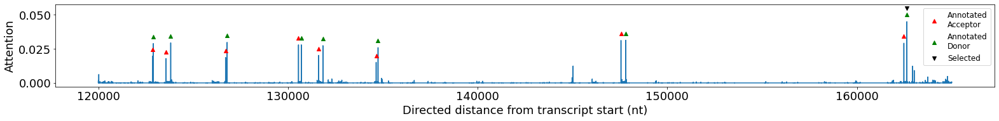

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 29/38 [03:34<01:31, 10.18s/it]

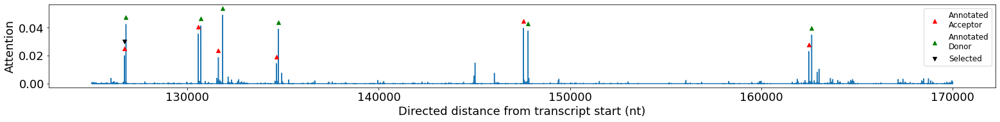

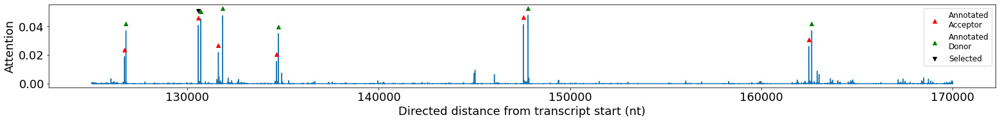

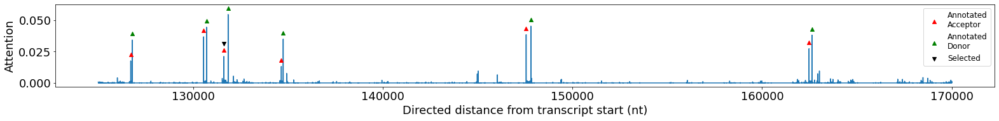

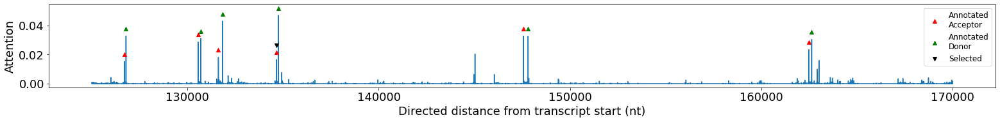

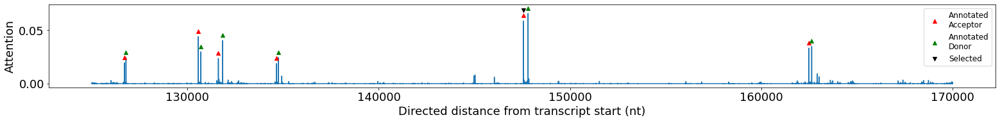

...

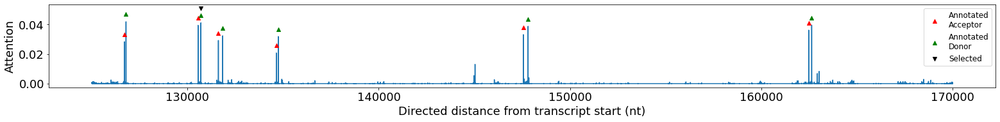

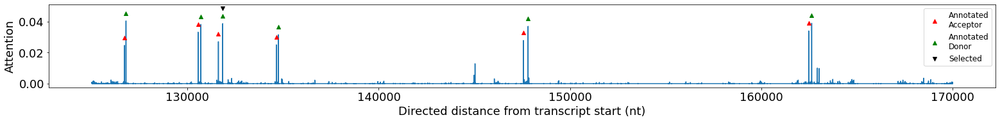

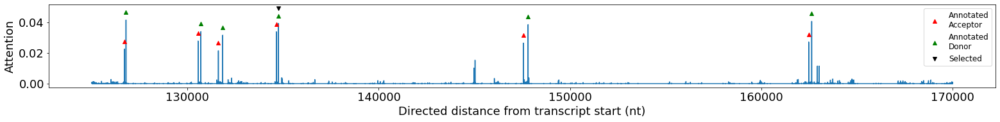

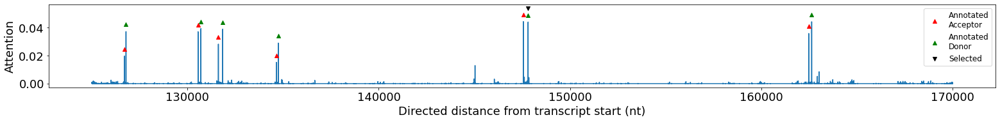

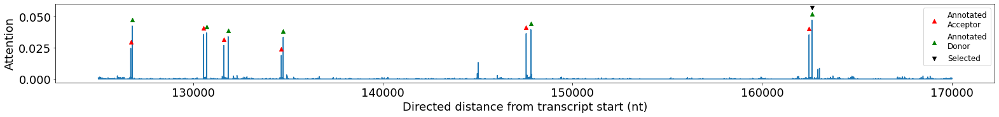

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 30/38 [03:41<01:14,  9.25s/it]

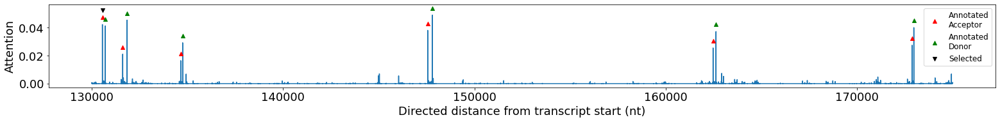

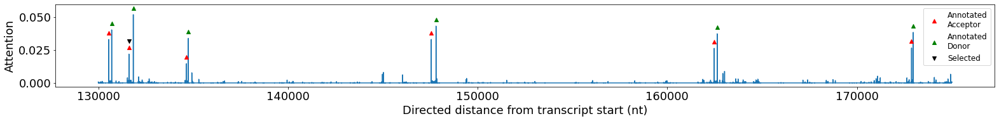

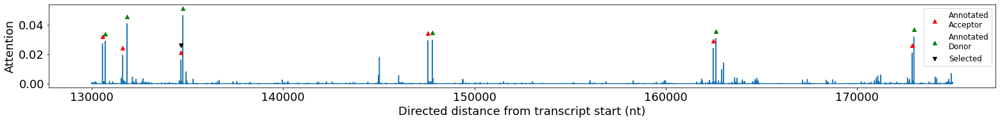

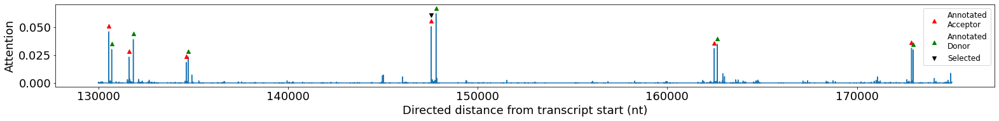

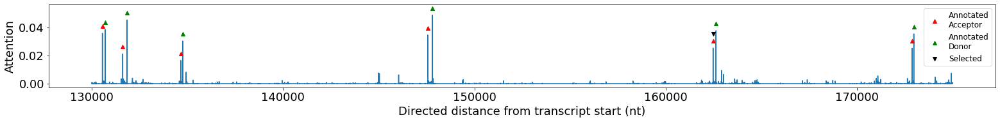

...

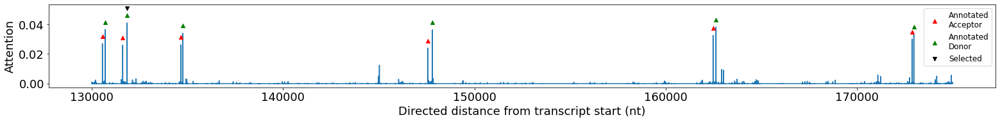

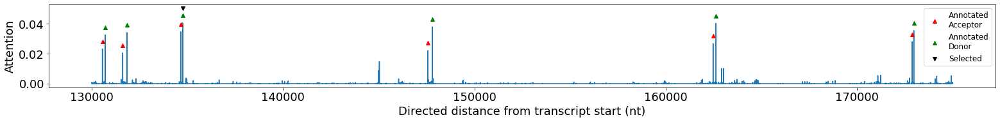

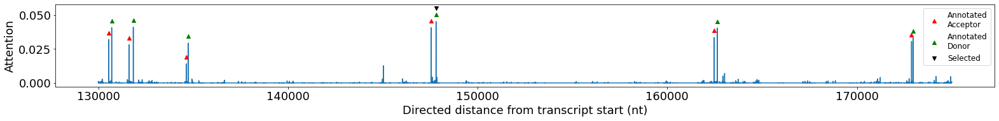

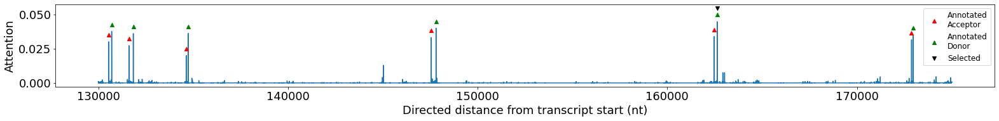

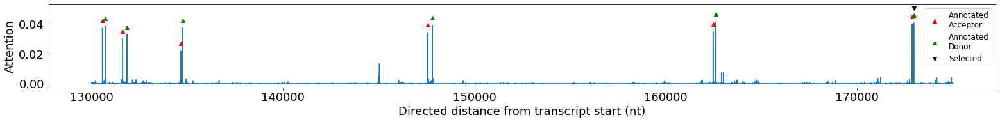

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 31/38 [03:48<01:00,  8.61s/it]

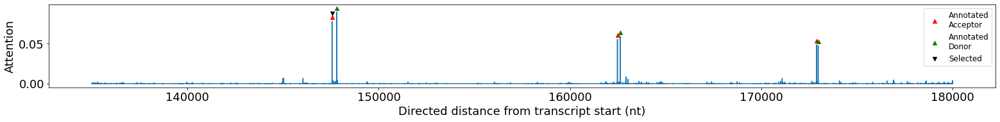

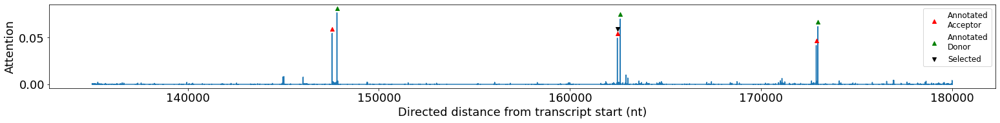

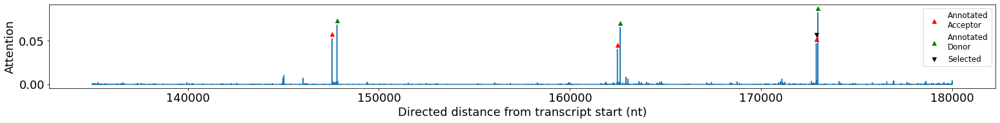

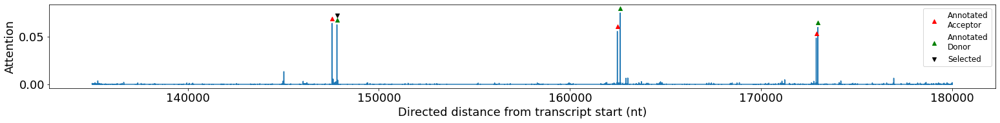

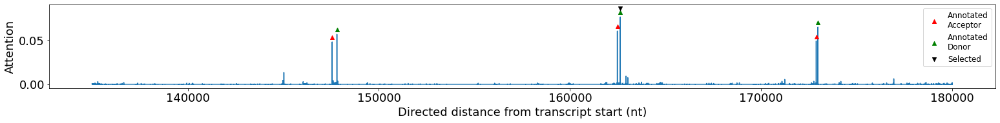

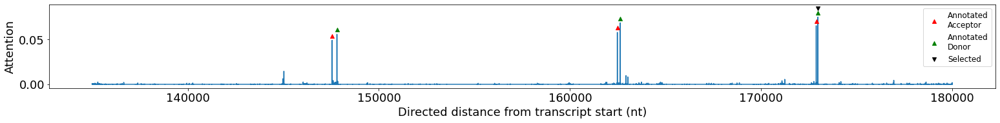

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/38 [03:51<00:42,  7.11s/it]

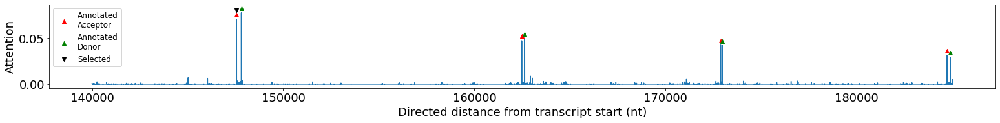

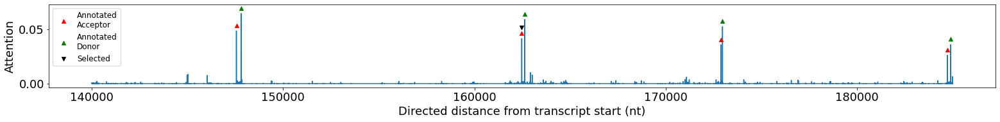

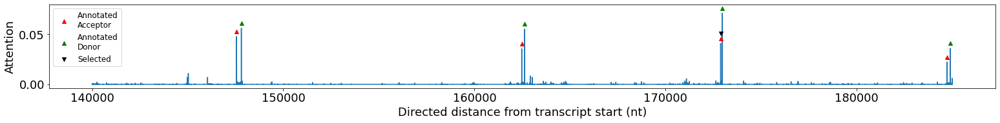

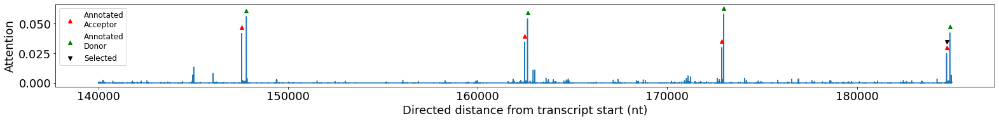

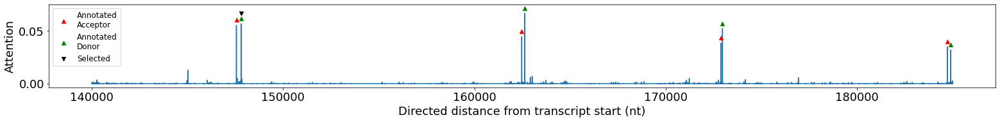

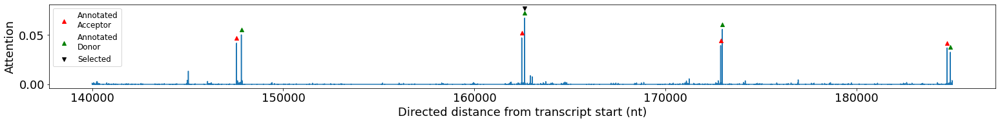

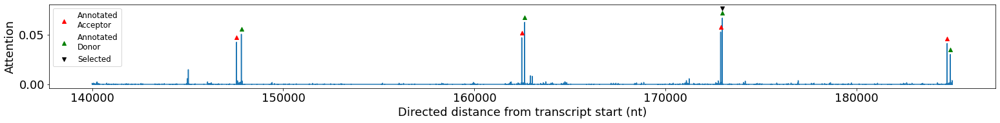

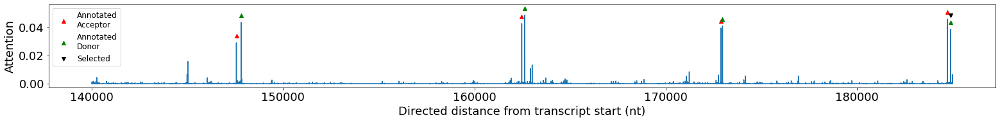

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 33/38 [03:56<00:32,  6.45s/it]

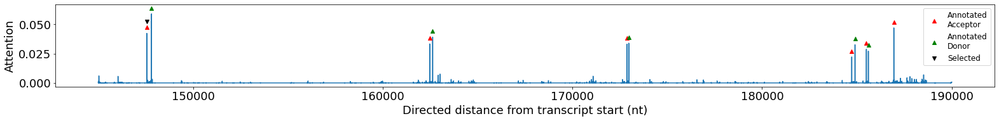

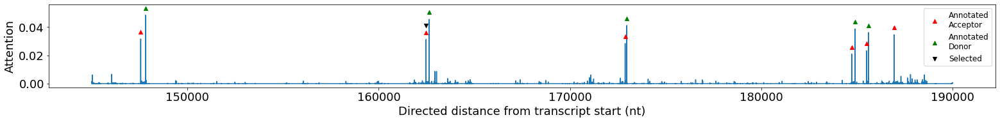

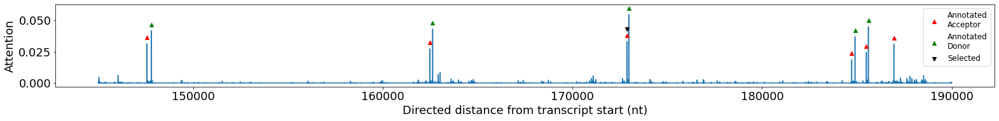

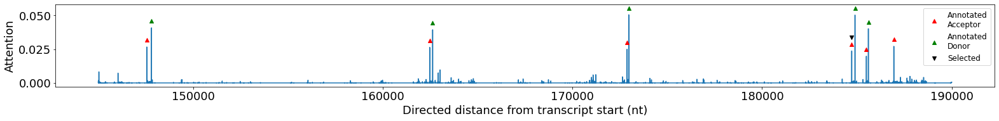

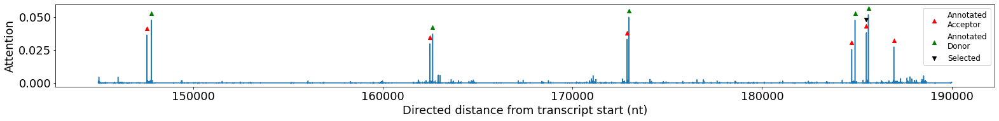

...

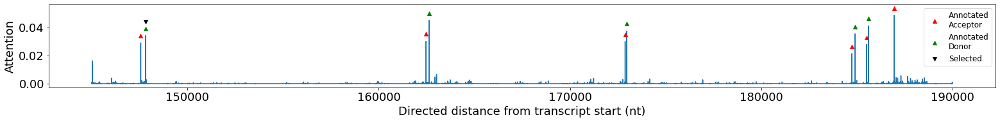

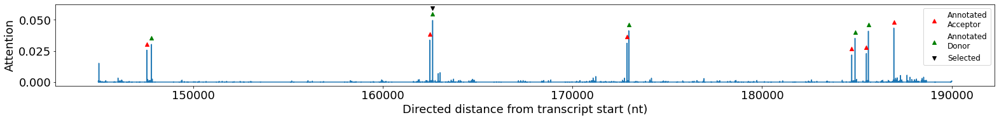

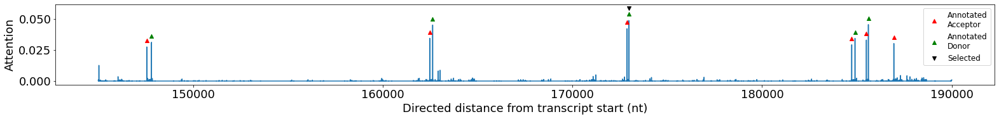

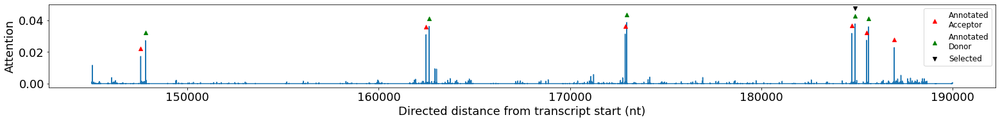

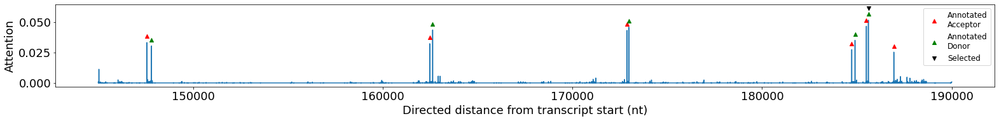

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 34/38 [04:03<00:25,  6.44s/it]

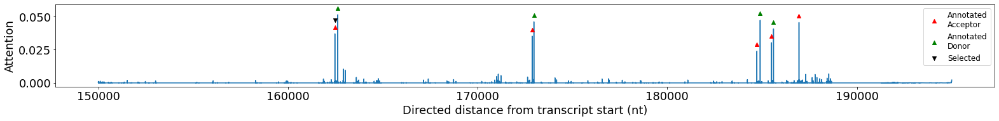

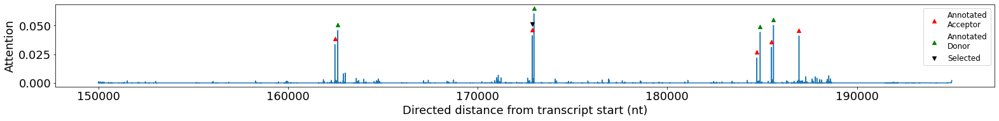

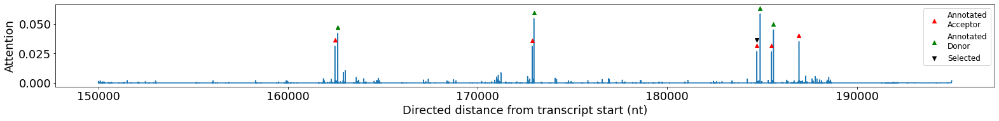

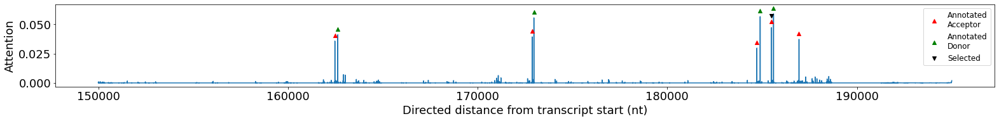

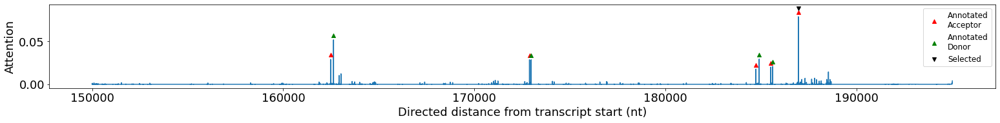

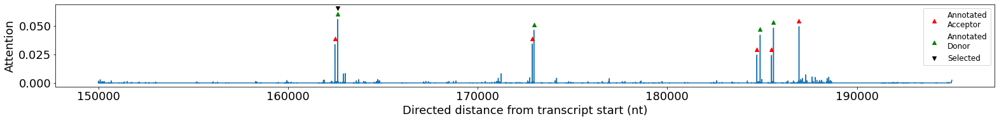

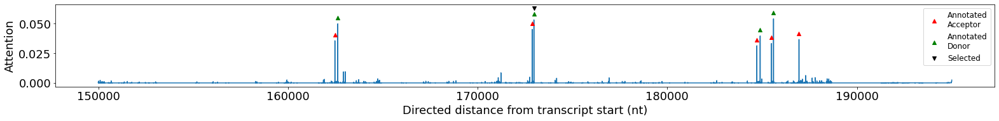

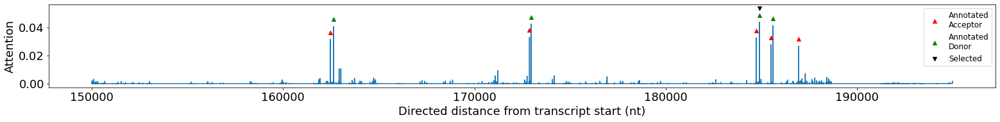

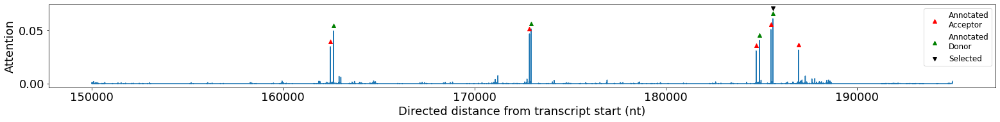

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 35/38 [04:08<00:18,  6.12s/it]

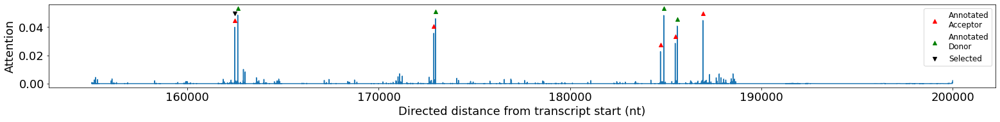

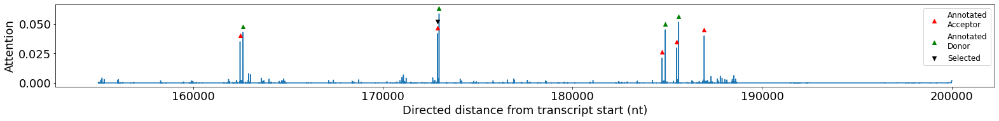

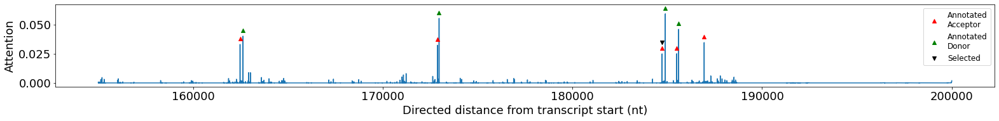

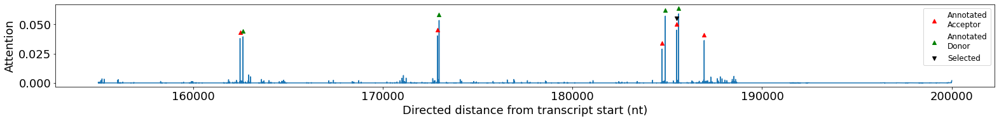

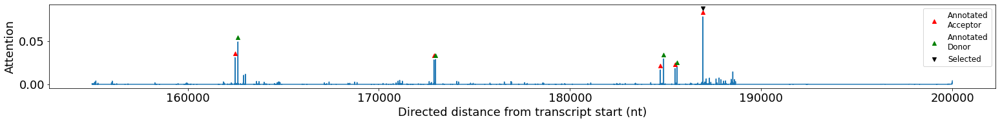

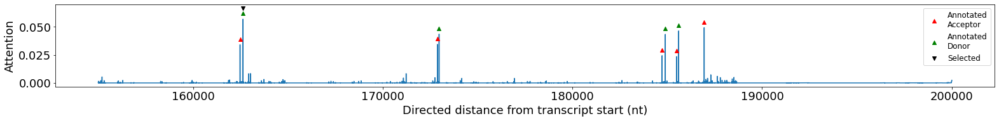

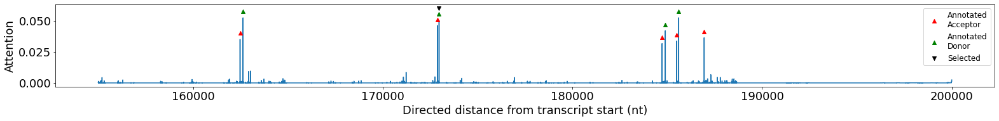

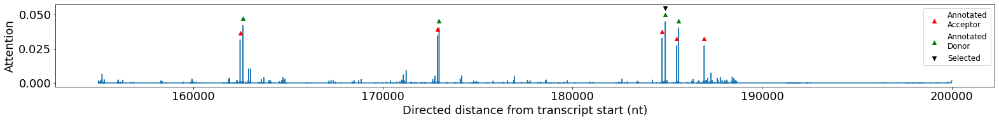

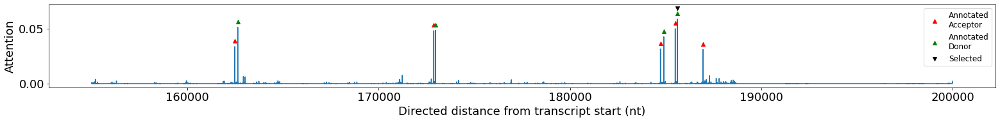

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 36/38 [04:13<00:11,  5.89s/it]

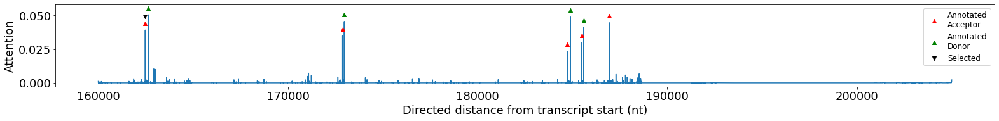

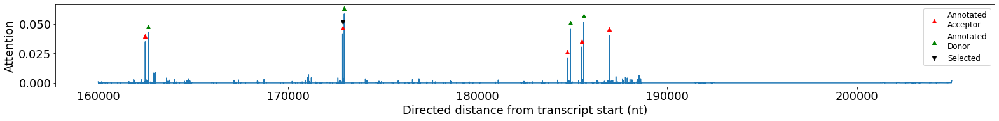

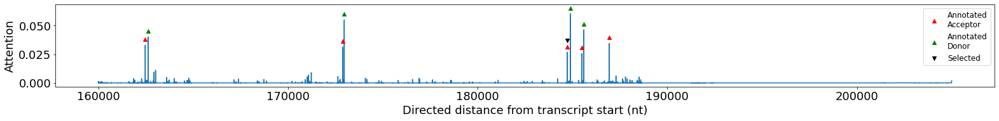

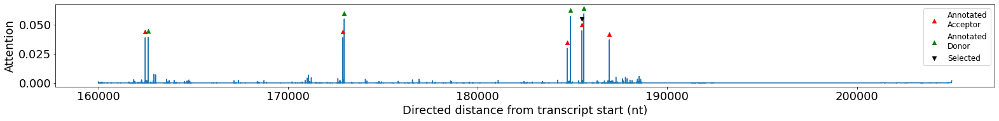

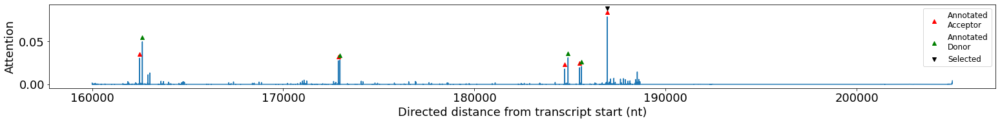

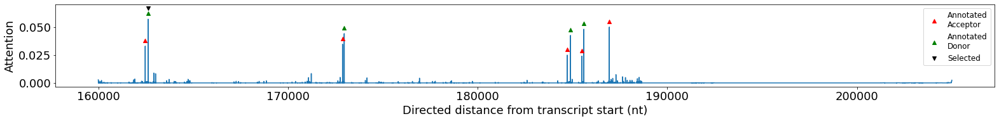

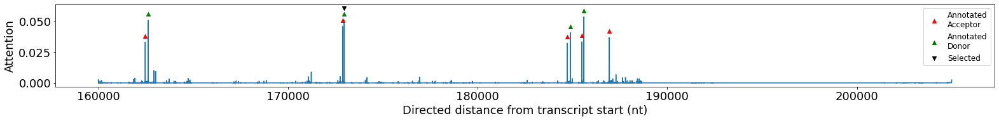

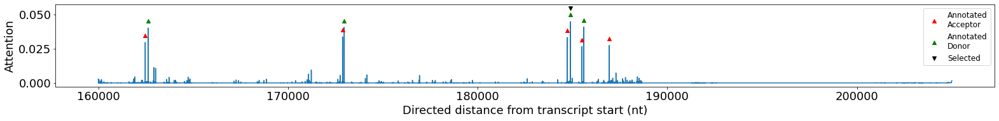

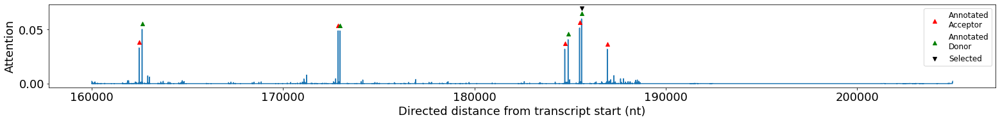

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 37/38 [04:19<00:05,  5.70s/it]

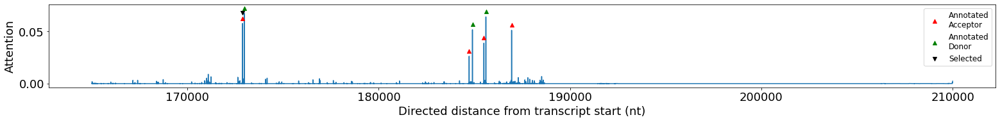

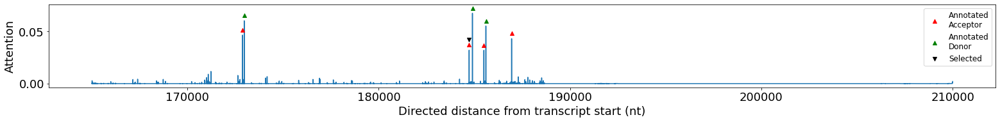

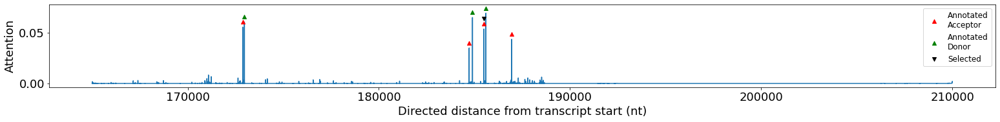

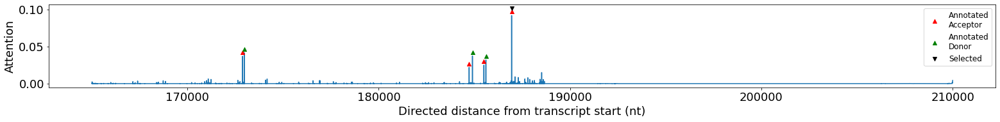

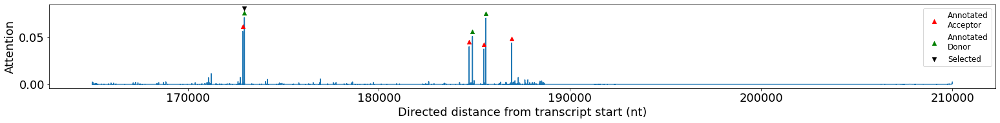

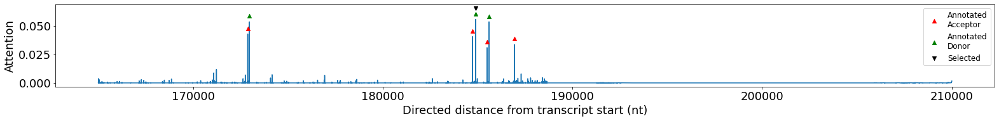

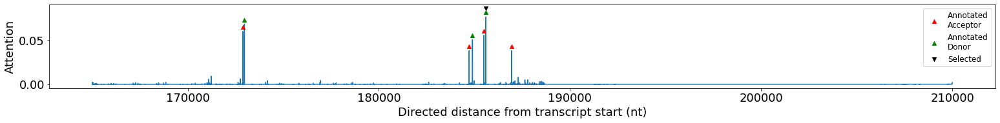

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [04:23<00:00,  6.93s/it]


In [41]:
test_dataset = spliceDataset(getDataPointListFull(specific_anno,transcriptToLabel_test,SL,CL_max,shift=SL))
test_dataset.seqData = seqData
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0, pin_memory=True)
for j,(batch_features ,target) in enumerate(tqdm(test_loader)):
    batch_features = batch_features.type(torch.FloatTensor).to(device)
    target = target.to(device)
    #out1,out2,actions,log_probs = models[0](batch_features)
    #print(actions[0,0,:])
    #print(log_probs[0,:])

    plotAttentionWeights(models,batch_features,target[0,:,:].cpu().detach(),j*5000,'CFTR')